In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt 
from matplotlib.pyplot import specgram
import seaborn as sns
import librosa
import librosa.display
import pickle
import IPython.display as ipd
import ipywidgets as widgets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from tqdm import tqdm
from keras.models import Sequential
from keras import utils
from keras.layers import Dense,Input, Flatten, Dropout, Activation, BatchNormalization,Conv1D, MaxPooling1D, AveragePooling1D
from tensorflow.keras.utils import to_categorical
from keras import losses, models, optimizers
from keras.activations import relu, softmax
from keras.layers import (Convolution2D, GlobalAveragePooling2D, BatchNormalization, Flatten, Dropout,
                          GlobalMaxPool2D, MaxPool2D, concatenate, Activation, Input, Dense)
from keras.layers import Conv2D, MaxPooling2D
import scipy
from scipy.stats import skew

In [2]:
RAVDESS = 'RAVDESS Emotional speech audio/audio_speech_actors_01-24/'

In [3]:
directory_list = os.listdir(RAVDESS)
directory_list = os.listdir(RAVDESS)
directory_list = [item for item in directory_list if not item.startswith('.')] 
directory_list.sort()
directory_list

['Actor_01',
 'Actor_02',
 'Actor_03',
 'Actor_04',
 'Actor_05',
 'Actor_06',
 'Actor_07',
 'Actor_08',
 'Actor_09',
 'Actor_10',
 'Actor_11',
 'Actor_12',
 'Actor_13',
 'Actor_14',
 'Actor_15',
 'Actor_16',
 'Actor_17',
 'Actor_18',
 'Actor_19',
 'Actor_20',
 'Actor_21',
 'Actor_22',
 'Actor_23',
 'Actor_24']

In [4]:
directory_list = os.listdir(RAVDESS)
directory_list.sort()

emotion = []

gender = []
path = []
for i in directory_list:
    folder_path = os.path.join(RAVDESS, i)
    if os.path.isdir(folder_path):
        fname = os.listdir(folder_path)
        for f in fname:
            file_path = os.path.join(folder_path, f) 
            part = f.split('.')[0].split('-')
            emotion.append(int(part[2]))
            temp = int(part[6])
            if temp%2 == 0:
                temp = "female"
            else:
                temp = "male"
            gender.append(temp)
            path.append(RAVDESS + i + '/' + f)


In [5]:
RAVDESS_df = pd.DataFrame(emotion)
RAVDESS_df = RAVDESS_df.replace({1:'neutral', 2:'neutral', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'})
RAVDESS_df = pd.concat([pd.DataFrame(gender), RAVDESS_df], axis=1)
RAVDESS_df.columns = ['gender', 'emotion']
RAVDESS_df['labels'] = RAVDESS_df.gender + '_' + RAVDESS_df.emotion
RAVDESS_df['source'] = 'RAVDESS'
RAVDESS_df = pd.concat([RAVDESS_df, pd.DataFrame(path, columns=['path'])], axis=1)
RAVDESS_df = RAVDESS_df.drop(['gender', 'emotion'], axis=1)

print(RAVDESS_df.head())
#print(RAVDESS_df)
print(RAVDESS_df.shape)

          labels   source                                               path
0  male_surprise  RAVDESS  RAVDESS Emotional speech audio/audio_speech_ac...
1  male_surprise  RAVDESS  RAVDESS Emotional speech audio/audio_speech_ac...
2     male_angry  RAVDESS  RAVDESS Emotional speech audio/audio_speech_ac...
3      male_fear  RAVDESS  RAVDESS Emotional speech audio/audio_speech_ac...
4      male_fear  RAVDESS  RAVDESS Emotional speech audio/audio_speech_ac...
(1440, 3)


In [6]:
RAVDESS_df.to_csv("Data_path.csv",index=False)

In [7]:
RAVDESS_df.labels.value_counts()

labels
male_neutral       144
female_neutral     144
male_surprise       96
male_angry          96
male_fear           96
male_disgust        96
male_sad            96
male_happy          96
female_fear         96
female_angry        96
female_sad          96
female_disgust      96
female_surprise     96
female_happy        96
Name: count, dtype: int64

In [8]:
RAVDESS_df.shape

(1440, 3)

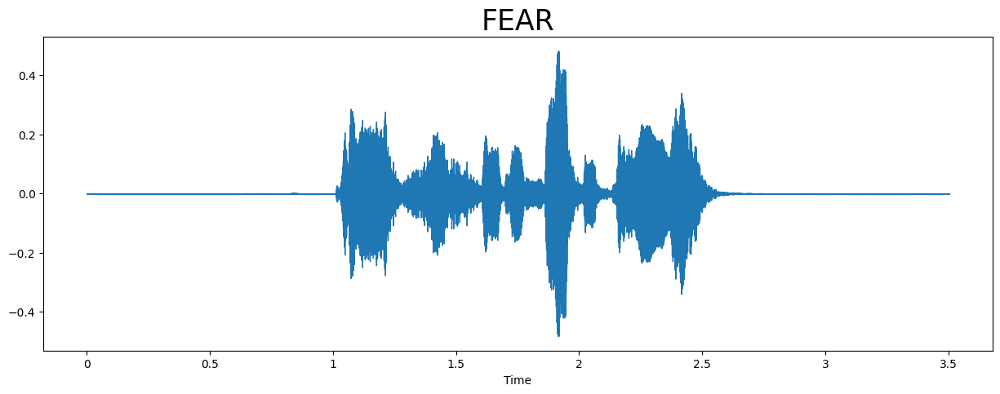

In [9]:
fname = RAVDESS + 'Actor_07/03-01-06-02-02-02-07.wav'
data, sample_rate = librosa.load(fname)
plt.figure(figsize = (15, 5))
librosa.display.waveshow(data, sr = sample_rate)
plt.title('FEAR', size = 25)

ipd.Audio(fname)

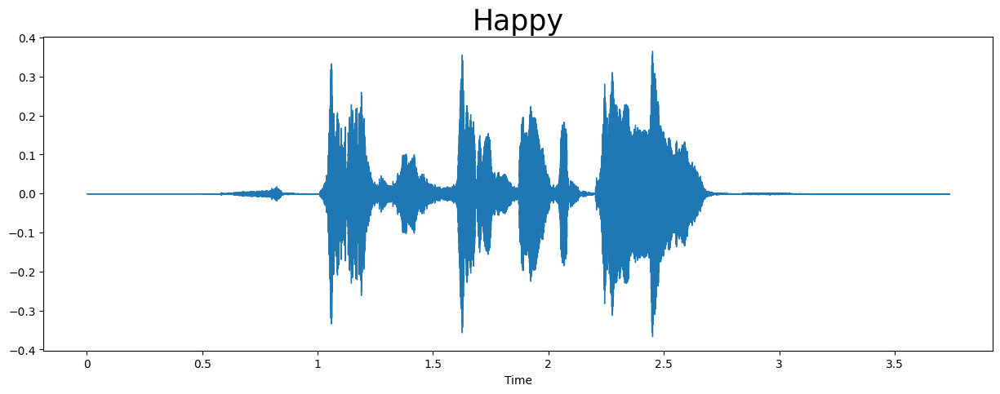

In [10]:
fname = RAVDESS + 'Actor_14/03-01-03-02-02-02-14.wav'  
data, sampling_rate = librosa.load(fname)
plt.figure(figsize=(15, 5))
librosa.display.waveshow(data, sr=sampling_rate)
plt.title('Happy', size = 25)

ipd.Audio(fname)

labels
male_neutral       144
female_neutral     144
male_surprise       96
male_angry          96
male_fear           96
male_disgust        96
male_sad            96
male_happy          96
female_fear         96
female_angry        96
female_sad          96
female_disgust      96
female_surprise     96
female_happy        96
Name: count, dtype: int64


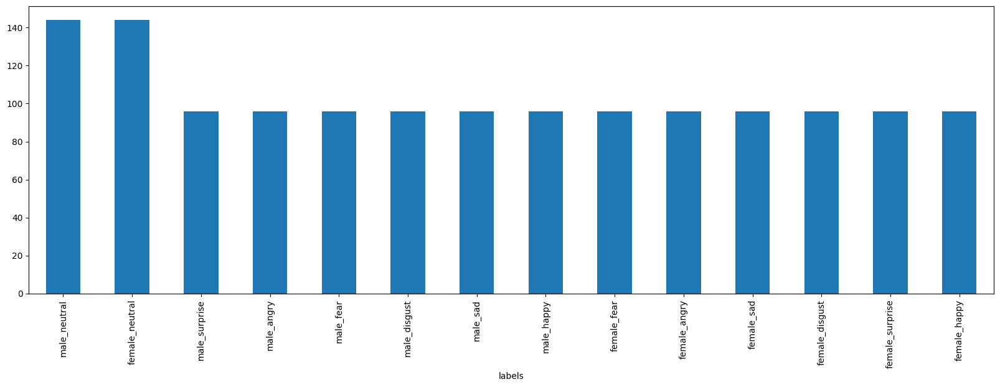

In [11]:
df = pd.concat([RAVDESS_df], axis = 0)
plt.figure(figsize = (20, 6))
df.labels.value_counts().plot(kind = 'bar')
print(df.labels.value_counts())
df.head()
df.to_csv("Data_path.csv",index=False)

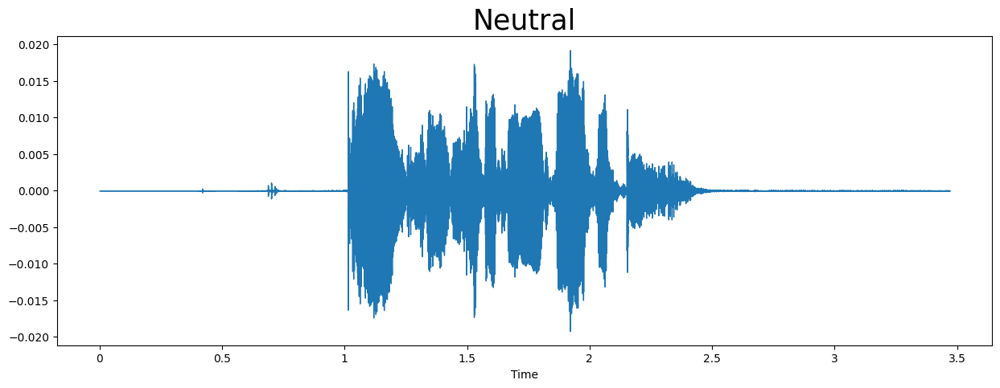

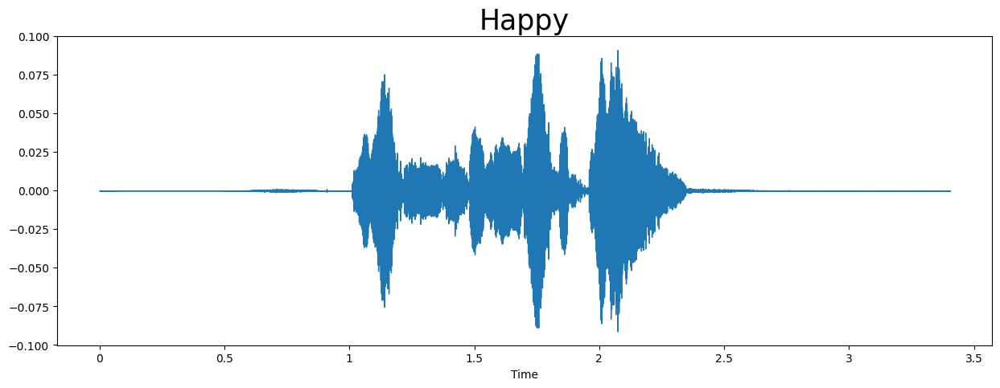

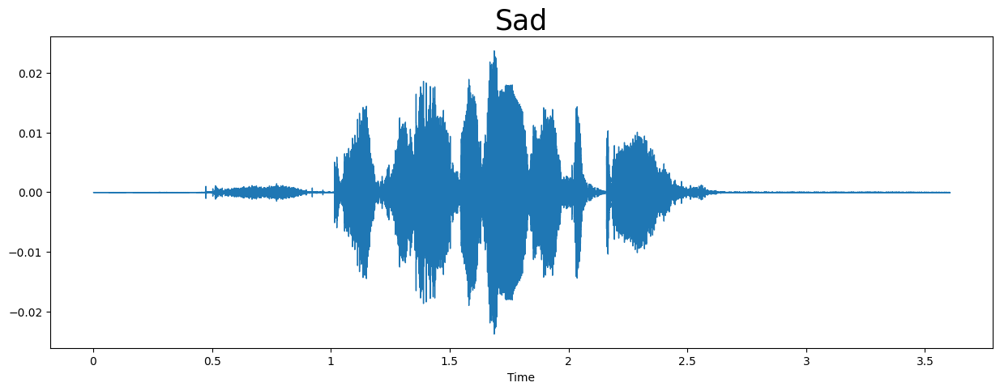

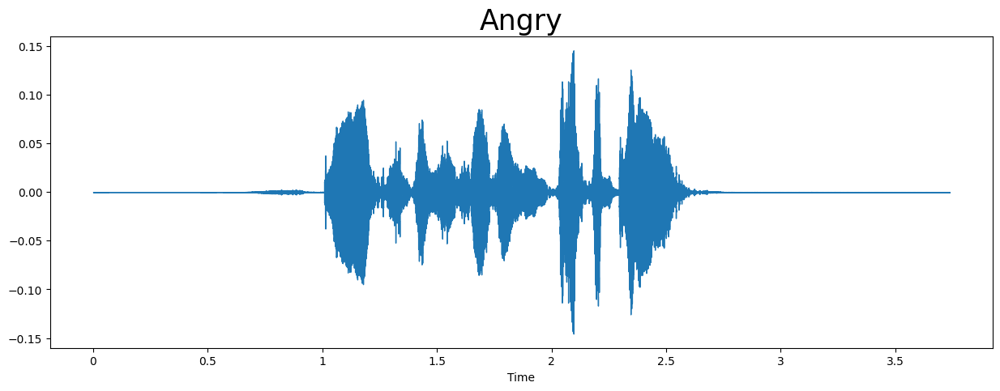

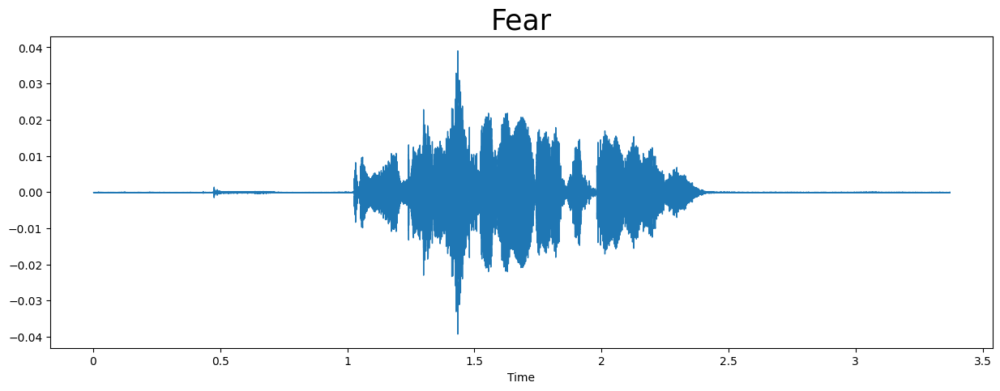

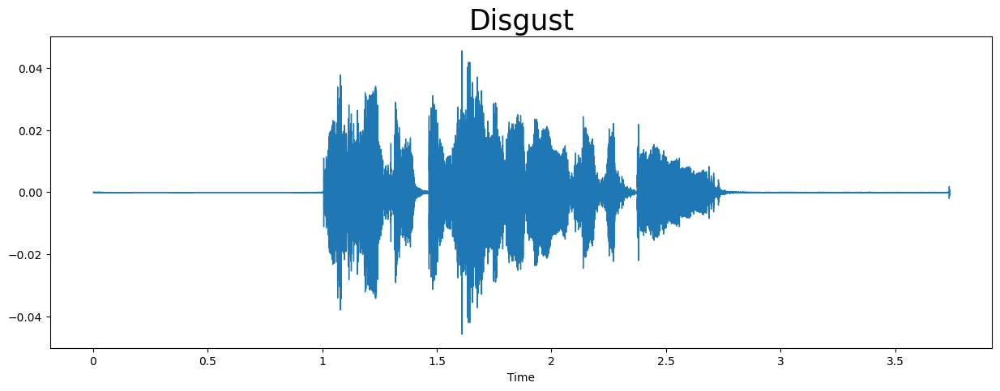

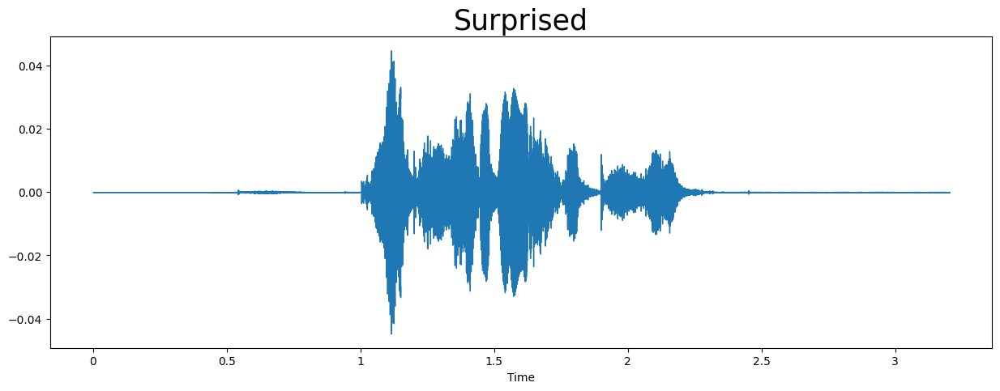

In [12]:
emotion_labels = {
    'neutral': '01',
    'happy': '03',
    'sad': '04',
    'angry': '05',
    'fear': '06',
    'disgust': '07',
    'surprised': '08'
}

for emotion, label in emotion_labels.items():
    fname = f"{RAVDESS}Actor_14/03-01-{label}-01-02-01-14.wav"
    
    data, sampling_rate = librosa.load(fname)
    plt.figure(figsize=(15, 5))
    librosa.display.waveshow(data, sr=sampling_rate)
    plt.title(emotion.capitalize(), size=25)
    
    ipd.display(ipd.Audio(fname))
    
    plt.show()

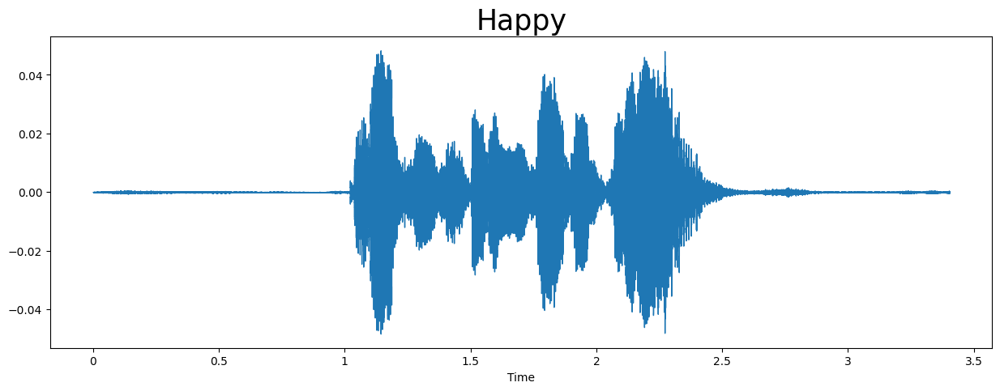

In [13]:
emotion_mapping = {
    '01': 'neutral',
    '03': 'happy',
    '04': 'sad',
    '05': 'angry',
    '06': 'fearful',
    '07': 'disgust',
    '08': 'surprised'
}

emotion_label = '03'
actor_number = '07'


emotion = emotion_mapping.get(emotion_label, 'unknown')


fname = f"{RAVDESS}Actor_{actor_number}/03-01-{emotion_label}-01-02-01-{actor_number}.wav"


data, sampling_rate = librosa.load(fname)
plt.figure(figsize=(15, 5))
librosa.display.waveshow(data, sr=sampling_rate)
plt.title(emotion.capitalize(), size=25)

ipd.display(ipd.Audio(fname))

plt.show()


In [14]:
emotion_mapping = {
    '01': 'neutral',
    '03': 'happy',
    '04': 'sad',
    '05': 'angry',
    '06': 'fearful',
    '07': 'disgust',
    '08': 'surprised'
}

def format_actor_number(actor_number):
    return f"{actor_number:02d}"


emotion_label_input = widgets.Dropdown(
    options=[('Neutral', '01'), ('Happy', '03'), ('Sad', '04'), ('Angry', '05'), ('Fearful', '06'), ('Disgust', '07'), ('Surprised', '08')],
    description='Emotion Label:'
)
actor_number_input = widgets.IntText(description='Actor Number:')
analyze_button = widgets.Button(description='Analyze Audio')

output = widgets.Output()

def analyze_audio(button):
    emotion_label = emotion_label_input.value
    actor_number = format_actor_number(actor_number_input.value)
    
    
    emotion = emotion_mapping.get(emotion_label, 'unknown')
    
    
    fname = f"{RAVDESS}Actor_{actor_number}/03-01-{emotion_label}-01-02-01-{actor_number}.wav"
    
    with output:
        output.clear_output()
        data, sampling_rate = librosa.load(fname)
        plt.figure(figsize=(15, 5))
        librosa.display.waveshow(data, sr=sampling_rate)
        plt.title(emotion.capitalize(), size=25)

        
        ipd.display(ipd.Audio(fname))

        plt.show()


analyze_button.on_click(analyze_audio)


display(emotion_label_input, actor_number_input, analyze_button, output)

Dropdown(description='Emotion Label:', options=(('Neutral', '01'), ('Happy', '03'), ('Sad', '04'), ('Angry', '…

IntText(value=0, description='Actor Number:')

Button(description='Analyze Audio', style=ButtonStyle())

Output()

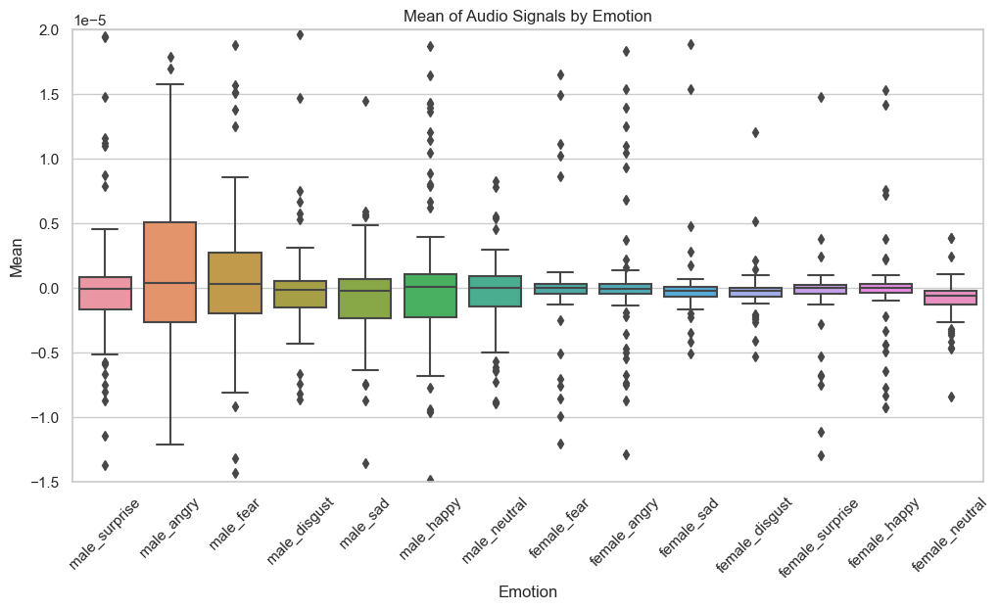

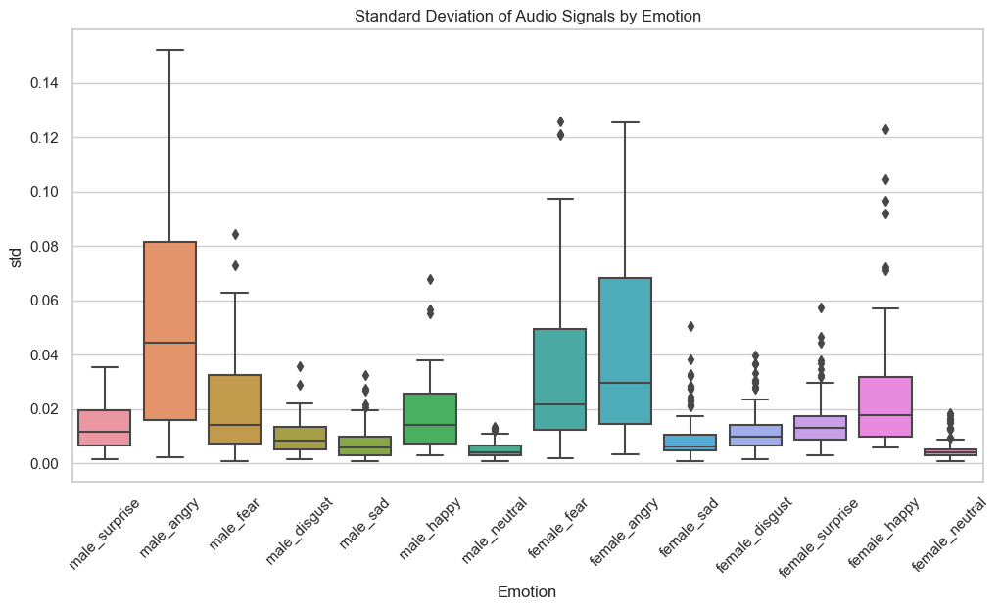

In [15]:
def compute_features(audio_path):
    data, _ = librosa.load(audio_path) 
    mean = np.mean(data)
    std = np.std(data)
    return mean, std

features_list = []

for index, row in RAVDESS_df.iterrows():
    mean, std = compute_features(row['path'])
    features_list.append({'Emotion': row['labels'], 'Mean': mean, 'std': std})

features_df = pd.DataFrame(features_list)

sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.boxplot(data=features_df, x='Emotion', y='Mean')
plt.title('Mean of Audio Signals by Emotion')
plt.xticks(rotation=45)

plt.ylim(-0.000015, 0.000020)

plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(data=features_df, x='Emotion', y='std')
plt.title('Standard Deviation of Audio Signals by Emotion')
plt.xticks(rotation=45)
plt.show()


In [16]:
print(features_df)

              Emotion          Mean       std
0       male_surprise  1.187545e-06  0.011334
1       male_surprise  7.108071e-07  0.005813
2          male_angry  5.472860e-07  0.012024
3           male_fear  4.137009e-07  0.007406
4           male_fear  2.784458e-06  0.040138
...               ...           ...       ...
1435      female_fear  2.578777e-07  0.033941
1436      female_fear -2.824810e-07  0.017373
1437     female_angry -3.950247e-08  0.022763
1438  female_surprise -1.095341e-07  0.004432
1439  female_surprise -6.728990e-06  0.022040

[1440 rows x 3 columns]


In [17]:
def mfcc_prep_plot(path):
    X, sample_rate = librosa.load(path, res_type='kaiser_fast', duration=2.5, sr=22050*2, offset=0.5)
    mfcc = librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=13)

    plt.figure(figsize=(20, 15))
    
    plt.subplot(3, 1, 1)
    librosa.display.waveshow(X, sr=sample_rate)
    plt.title('Audio sampled at 44100 Hz')

    ipd.display(ipd.Audio(path))

    plt.figure(figsize=(20, 15))
    plt.subplot(3, 1, 1)
    librosa.display.specshow(mfcc, x_axis='time')
    plt.ylabel('MFCC')
    plt.colorbar()
    
    plt.show()



In [18]:
male_angry_audio_path = "RAVDESS Emotional speech audio/audio_speech_actors_01-24/Actor_09/03-01-05-01-01-01-09.wav"
female_angry_audio_path = "RAVDESS Emotional speech audio/audio_speech_actors_01-24/Actor_08/03-01-05-02-01-01-08.wav"
male_happy_audio_path = "RAVDESS Emotional speech audio/audio_speech_actors_01-24/Actor_11/03-01-03-01-02-02-11.wav"
female_happy_audio_path = "RAVDESS Emotional speech audio/audio_speech_actors_01-24/Actor_12/03-01-03-01-02-01-12.wav"

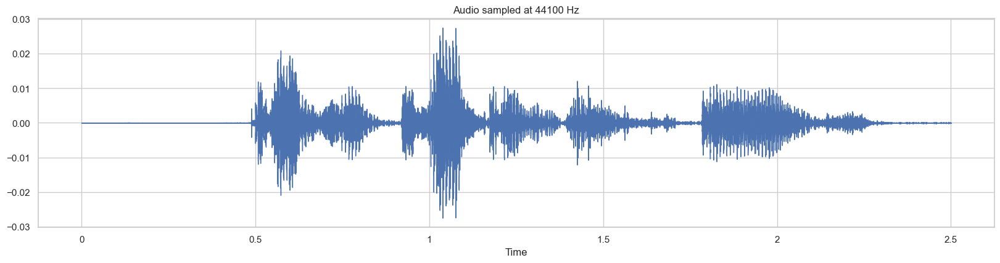

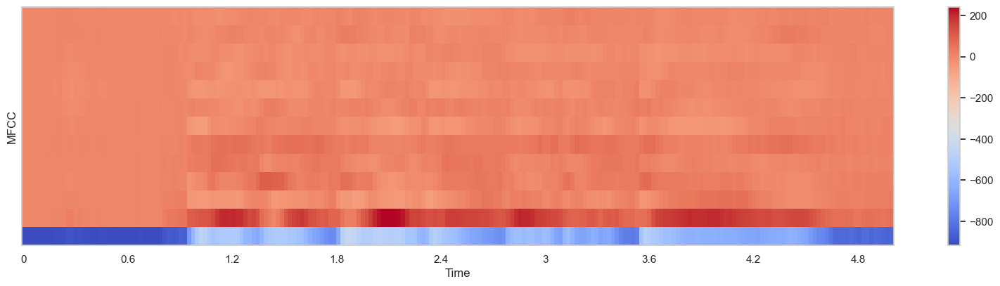

In [19]:
mfcc_prep_plot(male_angry_audio_path)

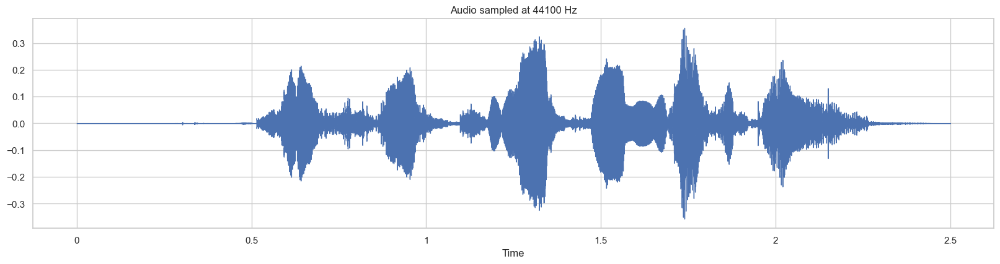

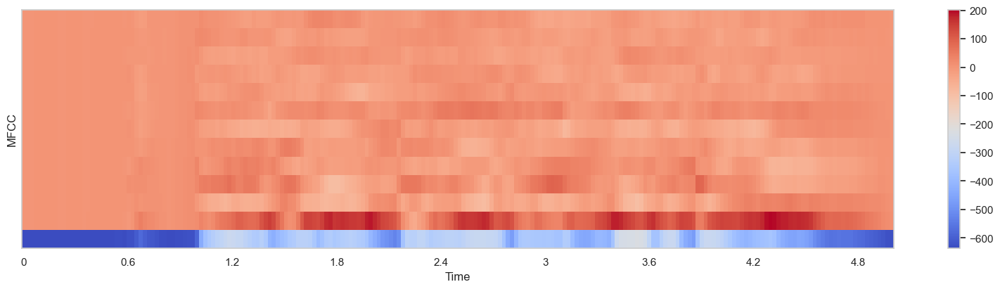

In [20]:
mfcc_prep_plot(female_angry_audio_path)

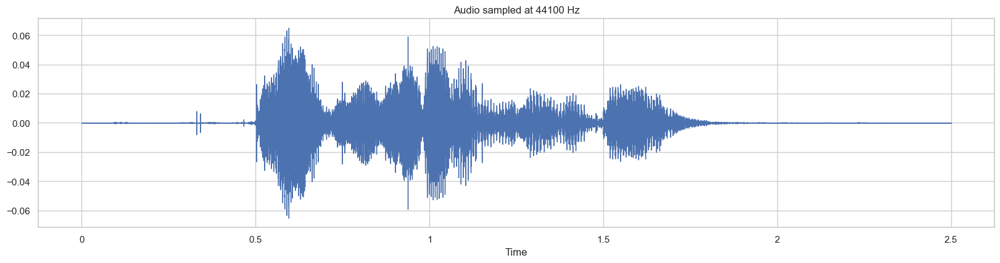

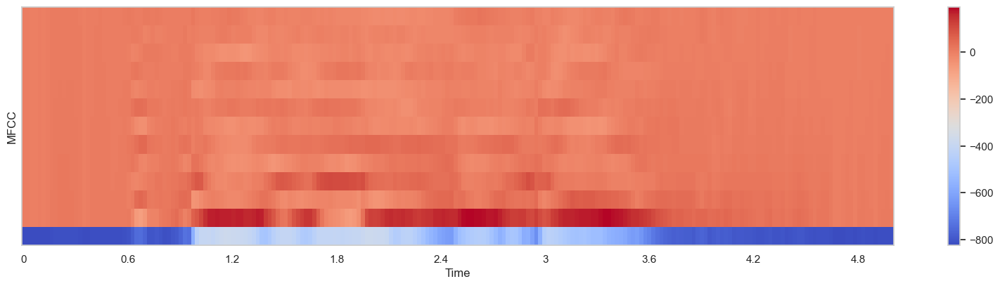

In [21]:
mfcc_prep_plot(male_happy_audio_path)

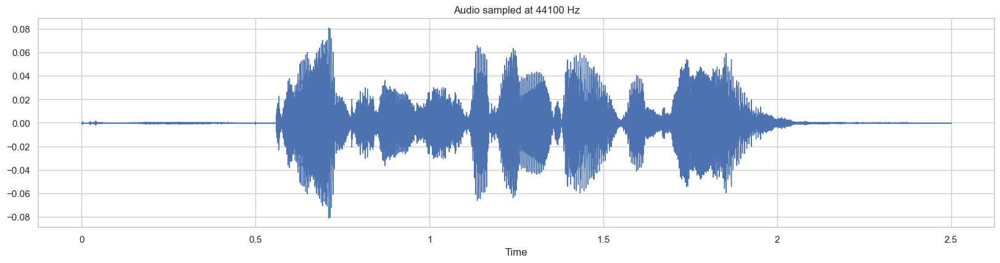

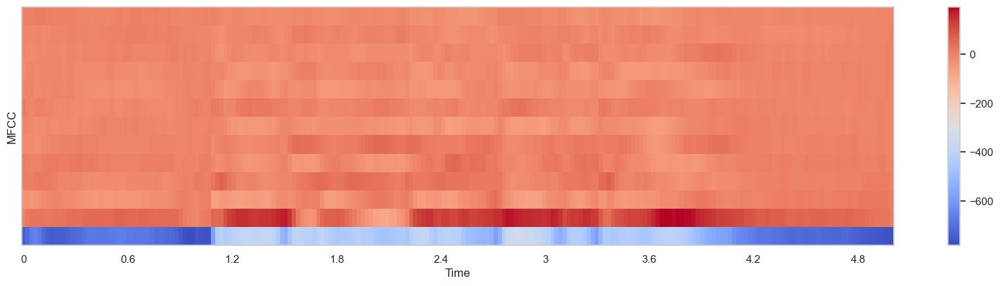

In [22]:
mfcc_prep_plot(female_happy_audio_path)

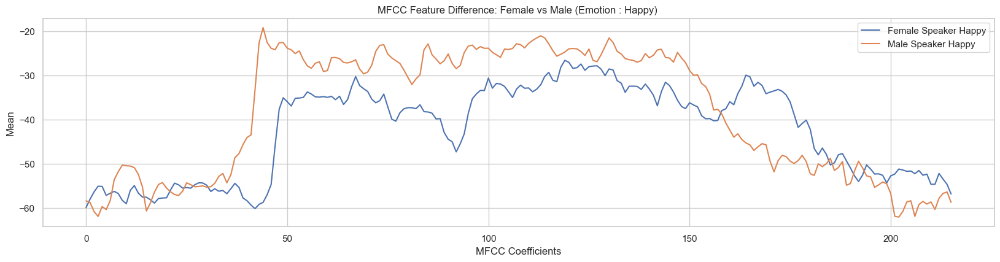

In [23]:
female_happy, sample_rate_female_happy = librosa.load(female_happy_audio_path, res_type='kaiser_fast', duration=2.5, sr=22050*2, offset=0.5)
female_happy_mfcc = librosa.feature.mfcc(y=female_happy, sr=sample_rate_female_happy, n_mfcc=13)
female_happy_mfcc_mean = np.mean(female_happy_mfcc, axis=0)

male_happy, sample_rate_male_happy = librosa.load(male_happy_audio_path, res_type='kaiser_fast', duration=2.5, sr=22050*2, offset=0.5)
male_happy_mfcc = librosa.feature.mfcc(y=male_happy, sr=sample_rate_male_happy, n_mfcc=13)
male_happy_mfcc_mean = np.mean(male_happy_mfcc, axis=0)


plt.figure(figsize=(20, 15))
plt.subplot(3, 1, 1)
plt.plot(female_happy_mfcc_mean, label='Female Speaker Happy')
plt.plot(male_happy_mfcc_mean, label='Male Speaker Happy')
plt.legend()
plt.title('MFCC Feature Difference: Female vs Male (Emotion : Happy) ')
plt.xlabel('MFCC Coefficients')
plt.ylabel('Mean')
plt.show()


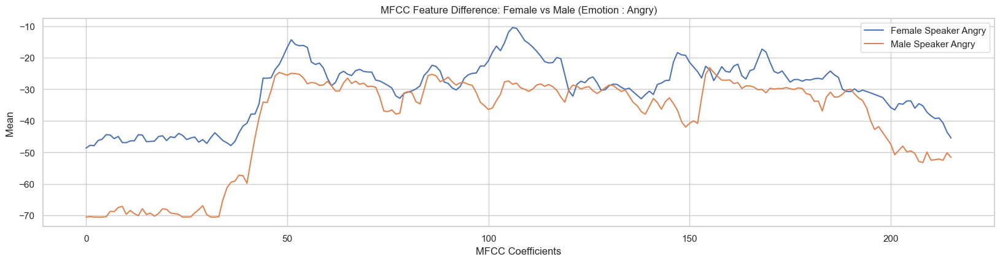

In [24]:
female_angry, sample_rate_female_angry = librosa.load(female_angry_audio_path, res_type='kaiser_fast', duration=2.5, sr=22050*2, offset=0.5)
female_angry_mfcc = librosa.feature.mfcc(y=female_angry, sr=sample_rate_female_angry, n_mfcc=13)
female_angry_mfcc_mean = np.mean(female_angry_mfcc, axis=0)

male_angry, sample_rate_male_angry = librosa.load(male_angry_audio_path, res_type='kaiser_fast', duration=2.5, sr=22050*2, offset=0.5)
male_angry_mfcc = librosa.feature.mfcc(y=male_angry, sr=sample_rate_male_angry, n_mfcc=13)
male_angry_mfcc_mean = np.mean(male_angry_mfcc, axis=0)


plt.figure(figsize=(20, 15))
plt.subplot(3, 1, 1)
plt.plot(female_angry_mfcc_mean, label='Female Speaker Angry')
plt.plot(male_angry_mfcc_mean, label='Male Speaker Angry')
plt.legend()
plt.title('MFCC Feature Difference: Female vs Male (Emotion : Angry)')
plt.xlabel('MFCC Coefficients')
plt.ylabel('Mean ')
plt.show()


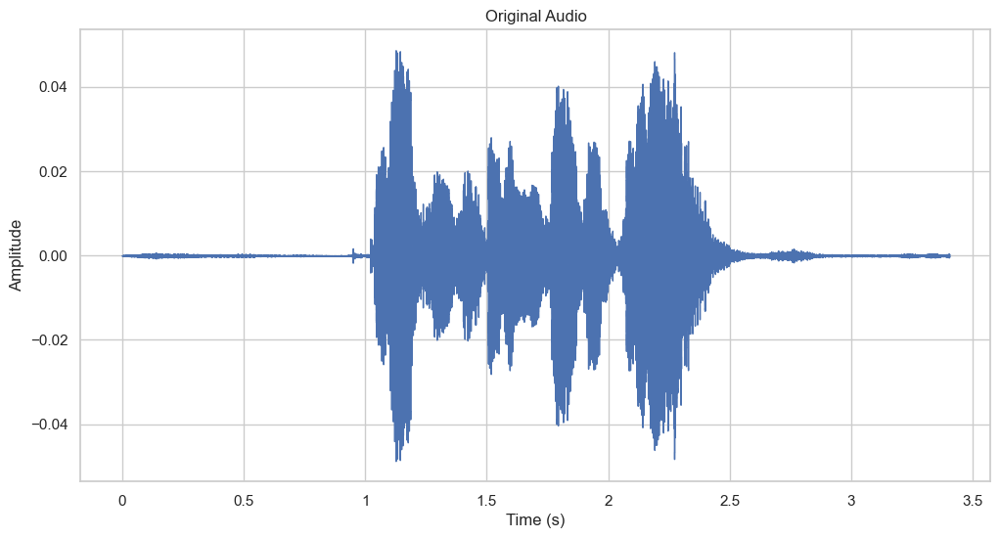

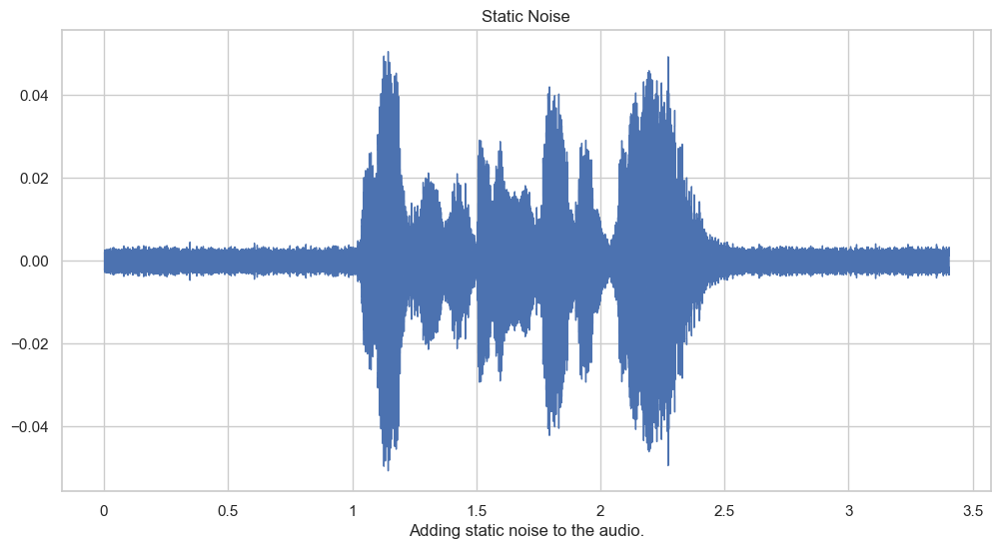

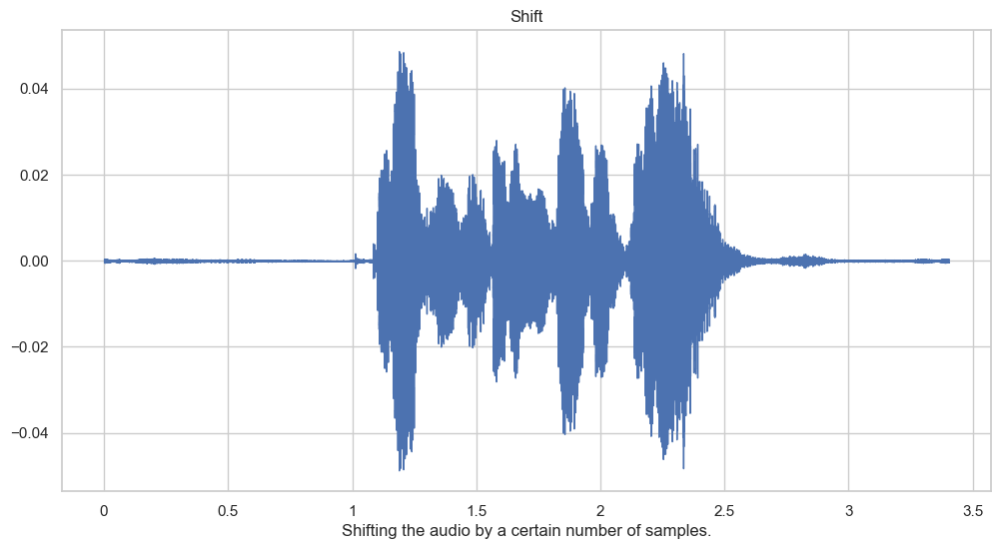

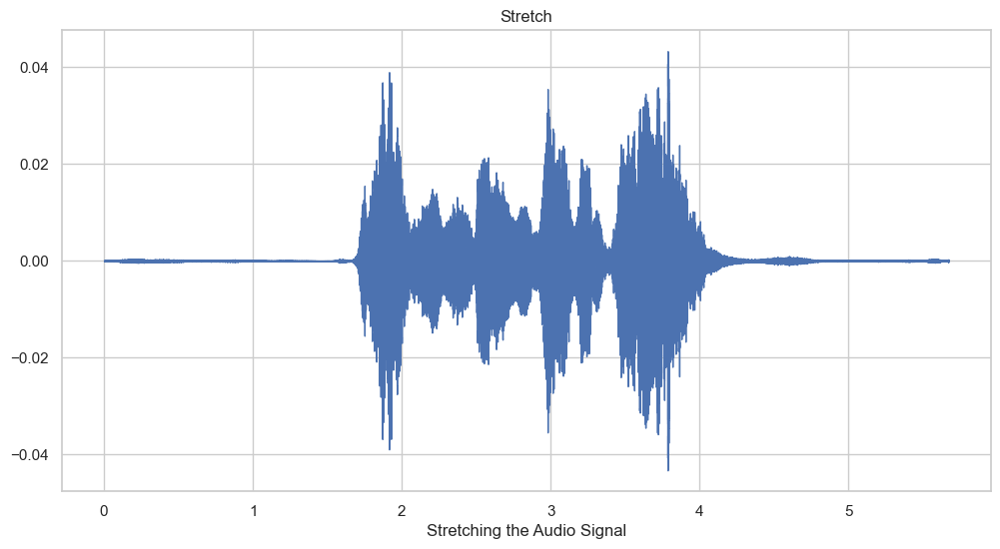

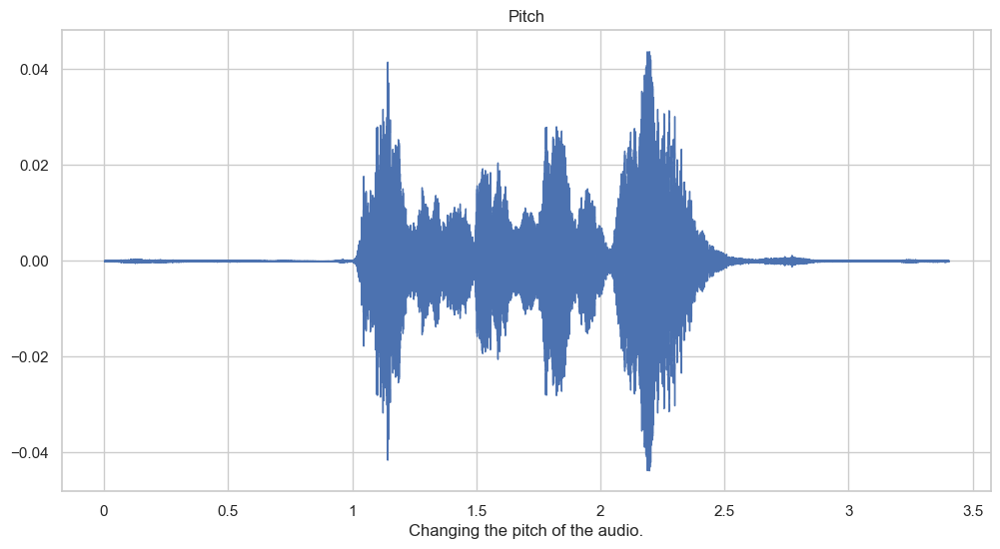

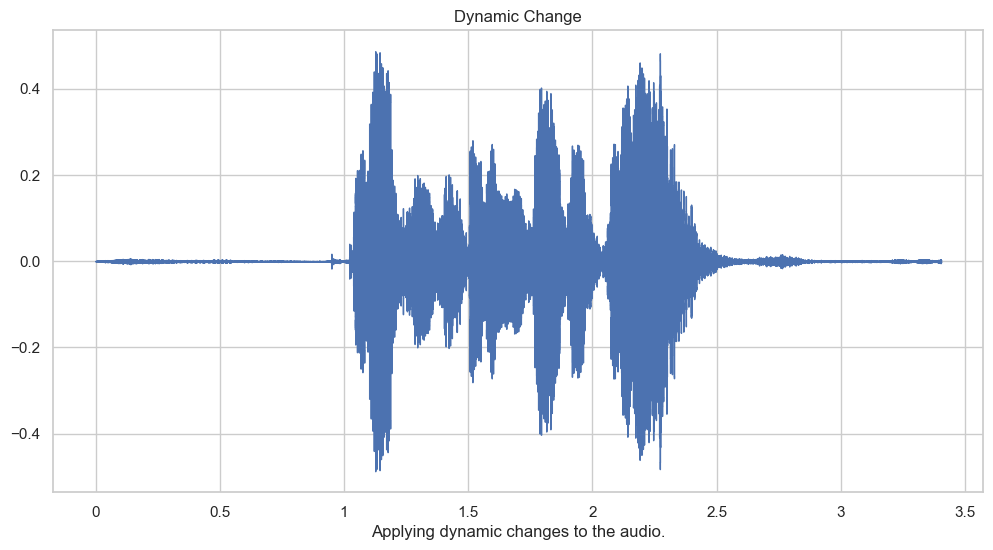

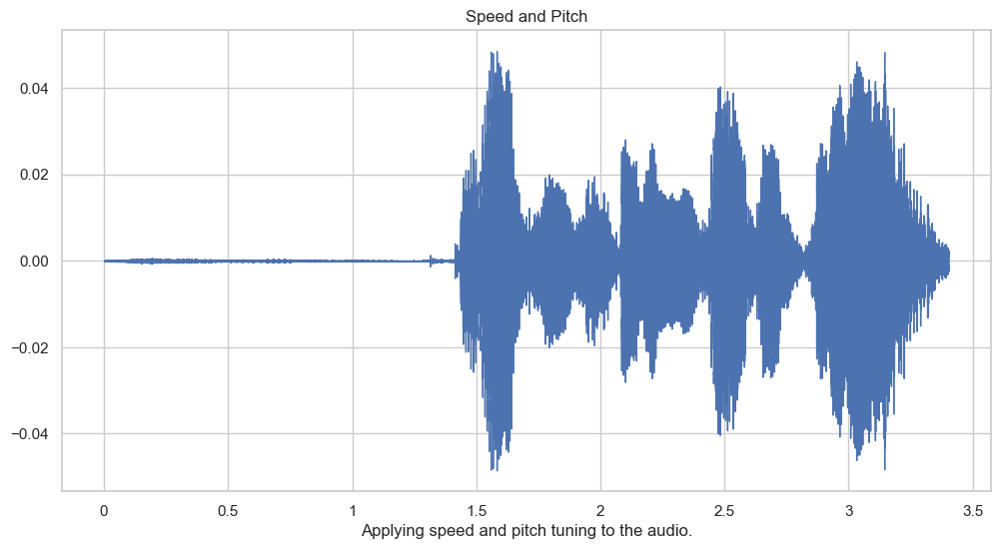

In [25]:
def load_audio(file_path):
    audio_data, sample_rate = librosa.load(file_path, sr=None)
    return audio_data, sample_rate

def apply_noise(audio_data, noise_factor=0.001):
    noise = np.random.normal(0, noise_factor, len(audio_data))
    augmented_audio = audio_data + noise
    augmented_audio = np.clip(augmented_audio, -1.0, 1.0)  
    return augmented_audio

def apply_shift(audio_data, shift_factor=3000):
    augmented_audio = np.roll(audio_data, shift_factor)
    return augmented_audio

def stretch(data, rate = 0.6):

    data = librosa.effects.time_stretch(y=data,rate=rate)
    return data

def apply_pitch(audio_data, pitch_factor=8):
    augmented_audio = librosa.effects.pitch_shift(audio_data, sr=sr, n_steps=pitch_factor)
    return augmented_audio

def apply_dynamic_change(audio_data, dynamic_factor=10):
    augmented_audio = audio_data * dynamic_factor
    augmented_audio = np.clip(augmented_audio, -1.0, 1.0)
    return augmented_audio

def speedNpitch(data):
    length_change = np.random.uniform(low=0.8, high=1)
    speed_fac = 0.7 / length_change
    tmp = np.interp(np.arange(0, len(data), speed_fac), np.arange(0, len(data)), data)
    minlen = min(data.shape[0], tmp.shape[0])
    data *= 0
    data[0:minlen] = tmp[0:minlen]
    return data

audio_file_path = 'RAVDESS Emotional speech audio/audio_speech_actors_01-24/Actor_07/03-01-03-01-02-01-07.wav'

data, sr = load_audio(audio_file_path)

plt.figure(figsize=(12, 6))
plt.subplot(1, 1, 1)
librosa.display.waveshow(data, sr=sr)
plt.title('Original Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

original_audio_widget = ipd.Audio(data, rate=sr)
display(original_audio_widget)

augmentations = [
    ("Static Noise", apply_noise, "Adding static noise to the audio."),
    ("Shift", apply_shift, "Shifting the audio by a certain number of samples."),
    ("Stretch", stretch, "Stretching the Audio Signal"),
    ("Pitch", apply_pitch, "Changing the pitch of the audio."),
    ("Dynamic Change", apply_dynamic_change, "Applying dynamic changes to the audio."),
    ("Speed and Pitch", speedNpitch, "Applying speed and pitch tuning to the audio.")
]

for aug_name, aug_func, description in augmentations:
    augmented_data = aug_func(data)
    
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 1, 1)
    librosa.display.waveshow(augmented_data, sr=sr)
    plt.title(aug_name)
    plt.xlabel(description)
    plt.show()
    
    augmented_audio_widget = ipd.Audio(augmented_data, rate=sr)
    display(augmented_audio_widget)


In [26]:
def noise(data):

    noise_amp = 0.05 * np.random.uniform() * np.random.normal(size = data.shape[0])
    data = data.astype('float64') + noise_amp * np.random.normal(size = data.shape[0])
    return data

def shift(data):

    s_range = int(np.random.uniform(low = -5, high = 5)*1000)
    return np.roll(data, s_range)

def stretch(data, rate = 0.6):

    data = librosa.effects.time_stretch(data, rate)
    return data

def pitch(data, sample_rate):

    bins_per_octave = 12
    pitch_pm = 2
    pitch_change = pitch_pm * 2 * (np.random.uniform())
    data = librosa.effects.pitch_shift(data.astype('float64'),
                                      sample_rate,
                                      n_steps = pitch_change,
                                      bins_per_octave = bins_per_octave
                                      )
    return data

def dyn_change(data):

    dyn_change = np.random.uniform(low = -0.5, high = 7)
    return data * dyn_change

def speedNpitch(data):

    length_change = np.random.uniform(low = 0.8, high = 1)
    speed_fac = 1.2 / length_change 
    tmp = np.interp(np.arange(0, len(data), speed_fac), np.arange(0, len(data)), data)
    minlen = min(data.shape[0], tmp.shape[0])
    data *=0
    data[0:minlen] = tmp[0:minlen]
    return data


def print_confusion_matrix(confusion_matrix, class_names, figsize = (10, 7), fontsize = 14):

    df_cm = pd.DataFrame(confusion_matrix, index = class_names, columns = class_names)
    fig = plt.figure(figsize = figsize)
    try:
        heatmap = sns.heatmap(df_cm, annot = True, fmt = 'd')
    except ValueError:
        raise ValueError('Confusion matrix must be integers.')
    
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)
                                 
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [27]:
reference = pd.read_csv('Data_path1.csv')
reference.head()


,labels,source,path
0,male_surprise,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...
1,male_surprise,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...
2,male_angry,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...
3,male_fear,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...
4,male_fear,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...


In [28]:
df = pd.DataFrame(columns = ['feature'])
df_noise = pd.DataFrame(columns = ['feature'])
df_speedNpitch = pd.DataFrame(columns = ['feature'])
count = 0

for i in tqdm(reference.path):
    
    X, sample_rate = librosa.load(i,
                                 res_type = 'kaiser_fast',
                                 duration = 2.5,
                                 sr = 44100,
                                 offset = 0.5
                                 )
    mfccs = np.mean(librosa.feature.mfcc(y = X,
                                        sr = np.array(sample_rate),
                                        n_mfcc = 13), axis = 0)
    df.loc[count] = [mfccs]
    
    aug = noise(X)
    aug = np.mean(librosa.feature.mfcc(y = aug,
                                      sr = np.array(sample_rate),
                                      n_mfcc = 13), axis = 0)
    df_noise.loc[count] = [aug]
    
    aug = speedNpitch(X)
    aug = np.mean(librosa.feature.mfcc(y = aug,
                                      sr = np.array(sample_rate),
                                      n_mfcc = 13), axis = 0)
    df_speedNpitch.loc[count] = [aug]
    
    count += 1

df.head()

100%|███████████████████████████████████████| 1440/1440 [01:08<00:00, 21.13it/s]


,feature
0,"[-61.862686, -61.862686, -61.862686, -61.86268..."
1,"[-61.508343, -61.508343, -61.508343, -61.50834..."
2,"[-56.16543, -56.166897, -56.158165, -54.663876..."
3,"[-63.523846, -63.523846, -63.523846, -63.52384..."
4,"[-44.64032, -44.249107, -43.996147, -44.132103..."


In [29]:
df = pd.concat([reference, pd.DataFrame(df['feature'].values.tolist())], axis = 1)
df_noise = pd.concat([reference, pd.DataFrame(df_noise['feature'].values.tolist())], axis = 1)
df_speedNpitch = pd.concat([reference, pd.DataFrame(df_speedNpitch['feature'].values.tolist())], axis = 1)
print(df.shape, df_noise.shape, df_speedNpitch.shape)

(1440, 219) (1440, 219) (1440, 219)


In [30]:
df = pd.concat([df, df_noise, df_speedNpitch], axis = 0, sort = False)
df = df.fillna(0)
del df_noise, df_speedNpitch
df.head()

,labels,source,path,0,1,2,3,4,5,6,...,206,207,208,209,210,211,212,213,214,215
0,male_surprise,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...,-61.862686,-61.862686,-61.862686,-61.862686,-61.862686,-61.862686,-61.862686,...,-61.862686,-61.862686,-61.761757,-60.348843,-60.160908,-61.384720,-60.519608,-61.496365,-61.862686,-61.146397
1,male_surprise,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...,-61.508343,-61.508343,-61.508343,-61.508343,-61.508343,-61.508343,-61.508343,...,-61.508343,-61.508343,-61.508343,-61.508343,-61.508343,-61.508343,-61.508343,-61.508343,-61.508343,-61.508343
2,male_angry,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...,-56.165428,-56.166897,-56.158165,-54.663876,-55.167160,-56.157265,-56.157265,...,-55.155525,-56.157265,-56.157265,-56.157265,-55.844578,-56.157265,-56.157265,-56.157265,-56.157265,-56.157265
3,male_fear,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...,-63.523846,-63.523846,-63.523846,-63.523846,-63.523846,-63.377724,-61.596287,...,-39.336967,-39.848244,-40.466457,-40.448551,-42.883549,-43.368042,-46.280754,-48.274254,-49.644100,-49.611149
4,male_fear,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...,-44.640320,-44.249107,-43.996147,-44.132103,-44.267784,-44.346008,-44.142799,...,-32.988121,-33.477657,-33.367554,-32.960381,-31.951490,-31.074728,-31.176338,-30.759197,-22.924541,-15.743834


In [31]:
df.shape

(4320, 219)

In [32]:
x_train, x_test, y_train, y_test = train_test_split(df.drop(['path', 'labels', 'source'], axis = 1), 
                                                   df.labels, 
                                                   test_size = 0.25,
                                                   shuffle = True,
                                                   random_state = 0)

x_train[30:40]

,0,1,2,3,4,5,6,7,8,9,...,206,207,208,209,210,211,212,213,214,215
1430,-52.417030,-52.417030,-52.422878,-52.444309,-52.479980,-52.706200,-52.688095,-52.607010,-52.441746,-52.438511,...,-38.116356,-39.050797,-38.653061,-37.518738,-37.121418,-37.159031,-36.373280,-36.229908,-31.855154,-28.254820
1070,-13.035441,-10.136168,-11.817352,-14.252746,-14.337569,-9.063465,-8.754130,-12.809237,-13.312063,-11.336942,...,-14.062548,-12.751832,-11.706658,-10.931795,-9.266349,-9.255174,-11.704638,-11.437782,-9.192217,-10.521836
1234,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146,...,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146,-50.789146
899,-49.858723,-48.915005,-50.764126,-49.522007,-47.811020,-49.110882,-48.828079,-48.781631,-48.617844,-48.778816,...,-43.142433,-42.137718,-41.298306,-41.986607,-42.428867,-44.251133,-44.368324,-43.451653,-44.427681,-45.493046
386,-53.936039,-52.492630,-51.942020,-52.817154,-54.652504,-56.915565,-57.324081,-56.917095,-54.596184,-54.187477,...,-48.272541,-50.799751,-50.776115,-51.097366,-51.171291,-50.122139,-49.048325,-49.426338,-50.371197,-53.670509
9,-48.300785,-44.522606,-43.072750,-40.865593,-39.502346,-40.385742,-43.393173,-44.405052,-44.480179,-45.014095,...,-56.209370,-56.209370,-56.209370,-56.209370,-56.209370,-56.209370,-56.209370,-56.209370,-56.209370,-56.209370
1144,-27.975646,-27.312398,-27.238895,-28.408417,-29.357600,-28.317505,-30.431200,-29.849596,-29.952679,-28.806555,...,-29.946498,-29.083341,-27.632826,-27.375227,-25.162681,-25.366022,-27.533626,-27.011490,-26.767827,-29.120426
766,-65.463585,-60.395184,-57.872524,-59.402390,-62.169338,-68.459770,-67.774422,-60.671867,-56.357822,-58.773605,...,-71.376770,-71.376770,-71.376770,-71.376770,-71.376770,-71.376770,-71.376770,-71.376770,-71.376770,-71.376770
637,-51.132038,-51.073391,-50.962742,-52.567318,-52.049747,-47.725590,-42.180199,-37.364403,-38.039223,-40.234261,...,-58.313293,-58.313293,-58.313293,-58.313293,-58.313293,-58.313293,-58.313293,-58.313293,-58.313293,-58.313293
769,-57.526974,-56.015018,-54.529133,-54.165146,-55.204380,-57.609550,-56.696220,-56.268738,-55.934441,-55.216545,...,-57.609550,-57.609550,-57.609550,-57.609550,-57.609550,-57.609550,-57.609550,-57.609550,-57.609550,-57.609550


In [33]:
mean = np.mean(x_train, axis = 0)
std = np.std(x_train, axis = 0)

x_train = (x_train - mean) / std
x_test = (x_test - mean) / std

x_train[30:40]

,0,1,2,3,4,5,6,7,8,9,...,206,207,208,209,210,211,212,213,214,215
1430,-0.424034,-0.472248,-0.469369,-0.470808,-0.474902,-0.489898,-0.490547,-0.486319,-0.481058,-0.483485,...,0.157806,0.116009,0.139785,0.200493,0.223094,0.224089,0.268691,0.281769,0.482299,0.676456
1070,1.692694,1.697214,1.605142,1.480906,1.471475,1.735150,1.750570,1.543432,1.515360,1.616881,...,1.347811,1.416882,1.470737,1.512470,1.595690,1.596951,1.482763,1.502182,1.587590,1.547113
1234,-0.336537,-0.388720,-0.385903,-0.386224,-0.388620,-0.392161,-0.393679,-0.393605,-0.396742,-0.399199,...,-0.469150,-0.464627,-0.459648,-0.454357,-0.450402,-0.446510,-0.440788,-0.434921,-0.441128,-0.429937
899,-0.286527,-0.292557,-0.384624,-0.321469,-0.236649,-0.306597,-0.293643,-0.291218,-0.285961,-0.296467,...,-0.090847,-0.036685,0.009130,-0.019981,-0.038438,-0.124841,-0.124786,-0.073727,-0.130874,-0.169909
386,-0.505679,-0.476127,-0.444802,-0.489862,-0.585764,-0.704506,-0.727033,-0.706140,-0.590979,-0.572860,...,-0.344647,-0.465151,-0.459004,-0.469567,-0.469233,-0.413693,-0.355114,-0.367836,-0.420744,-0.571407
9,-0.202789,-0.067180,0.008323,0.120902,0.187336,0.138239,-0.016403,-0.068006,-0.074855,-0.104083,...,-0.737302,-0.732737,-0.727366,-0.721827,-0.717491,-0.713183,-0.707546,-0.701736,-0.705477,-0.696060
1144,0.889670,0.815889,0.817265,0.757504,0.705015,0.753517,0.644801,0.674346,0.666346,0.724152,...,0.561991,0.609047,0.684103,0.701042,0.812377,0.804301,0.703736,0.735554,0.730412,0.633957
766,-1.125275,-0.881613,-0.747788,-0.826389,-0.969343,-1.293067,-1.260116,-0.897640,-0.680858,-0.807219,...,-1.487673,-1.482990,-1.476523,-1.470288,-1.464885,-1.459415,-1.454012,-1.448364,-1.445204,-1.440751
637,-0.354967,-0.403305,-0.394772,-0.477095,-0.452948,-0.235971,0.045472,0.291079,0.253766,0.140175,...,-0.841389,-0.836807,-0.831285,-0.825648,-0.821164,-0.816696,-0.811091,-0.805304,-0.808087,-0.799359
769,-0.698689,-0.656864,-0.576976,-0.558749,-0.613926,-0.739887,-0.695005,-0.673073,-0.659257,-0.625447,...,-0.806573,-0.801997,-0.796525,-0.790921,-0.786486,-0.782072,-0.776456,-0.770661,-0.773765,-0.764806


In [34]:
X_train = np.array(x_train)
y_train = np.array(y_train)
X_test = np.array(x_test)
y_test = np.array(y_test)

lb = LabelEncoder()
y_train = utils.to_categorical(lb.fit_transform(y_train))
y_test = utils.to_categorical(lb.fit_transform(y_test))
print('X_train Shape :: ', x_train.shape)
print('Label Classes :: ',lb.classes_)

X_train Shape ::  (3240, 216)
Label Classes ::  ['female_angry' 'female_disgust' 'female_fear' 'female_happy'
 'female_neutral' 'female_sad' 'female_surprise' 'male_angry'
 'male_disgust' 'male_fear' 'male_happy' 'male_neutral' 'male_sad'
 'male_surprise']


In [35]:
x_train = np.expand_dims(x_train, axis = 2)
x_test = np.expand_dims(x_test, axis = 2)
x_train.shape

(3240, 216, 1)

In [36]:
model = Sequential()
model.add(Conv1D(256, 8, padding='same',input_shape=(x_train.shape[1],1)))
model.add(Activation('relu'))
model.add(Conv1D(256, 8, padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.25))
model.add(MaxPooling1D(pool_size=(8)))
model.add(Conv1D(128, 8, padding='same'))
model.add(Activation('relu'))
model.add(Conv1D(128, 8, padding='same'))
model.add(Activation('relu'))
model.add(Conv1D(128, 8, padding='same'))
model.add(Activation('relu'))
model.add(Conv1D(128, 8, padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.25))
model.add(MaxPooling1D(pool_size=(8)))
model.add(Conv1D(64, 8, padding='same'))
model.add(Activation('relu'))
model.add(Conv1D(64, 8, padding='same'))
model.add(Activation('relu'))
model.add(Flatten())
model.add(Dense(14, activation = 'Softmax'))
opt = tf.keras.optimizers.legacy.RMSprop(learning_rate = 0.00001, decay = 1e-6)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 216, 256)          2304      
                                                                 
 activation (Activation)     (None, 216, 256)          0         
                                                                 
 conv1d_1 (Conv1D)           (None, 216, 256)          524544    
                                                                 
 batch_normalization (Batch  (None, 216, 256)          1024      
 Normalization)                                                  
                                                                 
 activation_1 (Activation)   (None, 216, 256)          0         
                                                                 
 dropout (Dropout)           (None, 216, 256)          0         
                                                        

In [37]:
model.compile(loss='categorical_crossentropy', optimizer=opt,metrics=['accuracy'])

In [38]:
model_history=model.fit(x_train, y_train, batch_size=16, epochs=20, validation_data=(x_test, y_test),verbose=2)

Epoch 1/20
203/203 - 13s - loss: 2.5524 - accuracy: 0.1500 - val_loss: 2.6324 - val_accuracy: 0.0944 - 13s/epoch - 65ms/step
Epoch 2/20
203/203 - 13s - loss: 2.4219 - accuracy: 0.2096 - val_loss: 2.5988 - val_accuracy: 0.1454 - 13s/epoch - 65ms/step
Epoch 3/20
203/203 - 13s - loss: 2.3413 - accuracy: 0.2296 - val_loss: 2.4901 - val_accuracy: 0.2009 - 13s/epoch - 66ms/step
Epoch 4/20
203/203 - 14s - loss: 2.2770 - accuracy: 0.2370 - val_loss: 2.3968 - val_accuracy: 0.2222 - 14s/epoch - 68ms/step
Epoch 5/20
203/203 - 14s - loss: 2.2209 - accuracy: 0.2586 - val_loss: 2.3437 - val_accuracy: 0.2333 - 14s/epoch - 68ms/step
Epoch 6/20
203/203 - 14s - loss: 2.1790 - accuracy: 0.2722 - val_loss: 2.3138 - val_accuracy: 0.2509 - 14s/epoch - 70ms/step
Epoch 7/20
203/203 - 14s - loss: 2.1373 - accuracy: 0.2728 - val_loss: 2.2815 - val_accuracy: 0.2407 - 14s/epoch - 69ms/step
Epoch 8/20
203/203 - 14s - loss: 2.0959 - accuracy: 0.2985 - val_loss: 2.2660 - val_accuracy: 0.2722 - 14s/epoch - 70ms/step


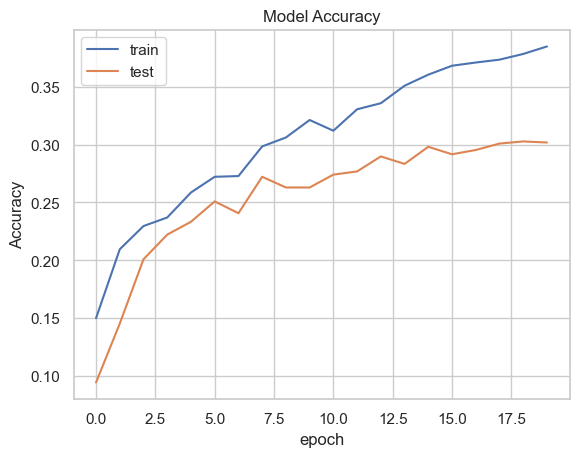

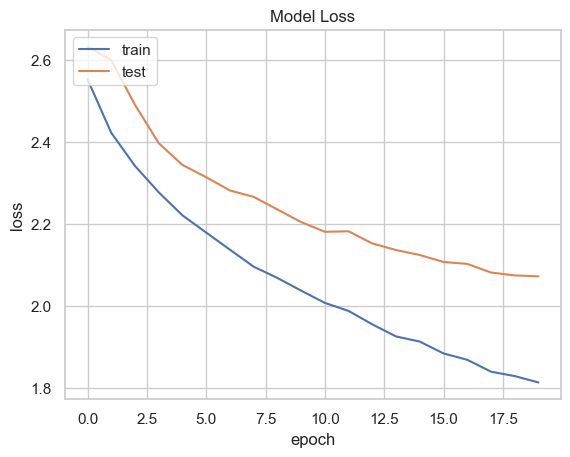

In [39]:
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [39]:
model.save(os.path.join('models','benchmark.h5'))

/Users/half_a_hulk/Desktop/Senti Analysis/SentiAnalysis/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [40]:
from tensorflow.keras.models import load_model

In [41]:
benchmark_model = load_model('models/benchmark.h5')

In [40]:
predictions = model.predict(x_test, 
                         batch_size=16, 
                         verbose=1)

predictions=predictions.argmax(axis=1)
predictions

68/68 [==============================] - 1s 17ms/step


array([10,  4,  4, ...,  3, 11,  4])

In [41]:
predictions = predictions.astype(int).flatten()
predictions = (lb.inverse_transform((predictions)))
predictions = pd.DataFrame({'Predicted_Values': predictions})

actual=y_test.argmax(axis=1)
actual = actual.astype(int).flatten()
actual = (lb.inverse_transform((actual)))
actual = pd.DataFrame({'Actual_Values': actual})

finaldf = actual.join(predictions)
finaldf[170:180]

,Actual_Values,Predicted_Values
170,female_fear,female_fear
171,male_surprise,female_surprise
172,female_fear,male_fear
173,female_disgust,female_happy
174,male_surprise,male_happy
175,male_sad,female_neutral
176,female_fear,female_fear
177,male_sad,male_neutral
178,female_disgust,female_neutral
179,male_surprise,male_surprise


In [42]:
finaldf.to_csv('Predictions.csv', index=False)
finaldf.groupby('Predicted_Values').count()

,Actual_Values
Predicted_Values,
female_angry,40
female_disgust,44
female_fear,10
female_happy,101
female_neutral,295
female_sad,24
female_surprise,56
male_angry,53
male_disgust,10


0.30185185185185187


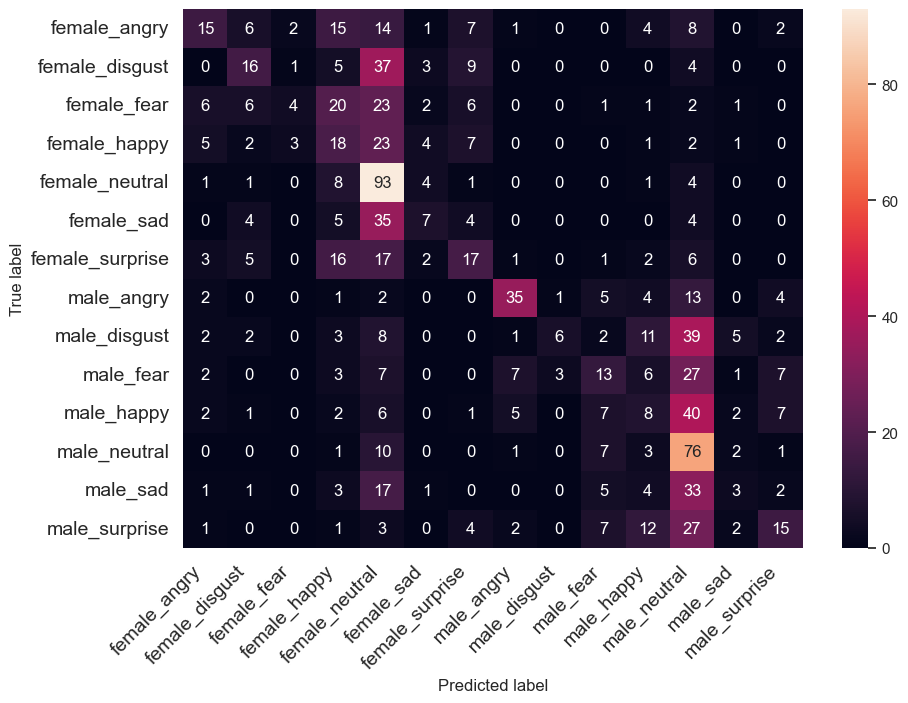

In [43]:
final_df = pd.read_csv("Predictions.csv")
classes = final_df.Actual_Values.unique()
classes.sort()    

c_m = confusion_matrix(final_df.Actual_Values, final_df.Predicted_Values)
print(accuracy_score(final_df.Actual_Values, final_df.Predicted_Values))
print_confusion_matrix(c_m, class_names = classes)

In [44]:
classes = final_df.Actual_Values.unique()
classes.sort()    
print(classification_report(final_df.Actual_Values, final_df.Predicted_Values, target_names=classes))

                 precision    recall  f1-score   support

   female_angry       0.38      0.20      0.26        75
 female_disgust       0.36      0.21      0.27        75
    female_fear       0.40      0.06      0.10        72
   female_happy       0.18      0.27      0.22        66
 female_neutral       0.32      0.82      0.46       113
     female_sad       0.29      0.12      0.17        59
female_surprise       0.30      0.24      0.27        70
     male_angry       0.66      0.52      0.58        67
   male_disgust       0.60      0.07      0.13        81
      male_fear       0.27      0.17      0.21        76
     male_happy       0.14      0.10      0.12        81
   male_neutral       0.27      0.75      0.39       101
       male_sad       0.18      0.04      0.07        70
  male_surprise       0.38      0.20      0.26        74

       accuracy                           0.30      1080
      macro avg       0.34      0.27      0.25      1080
   weighted avg       0.34   

0.8759259259259259


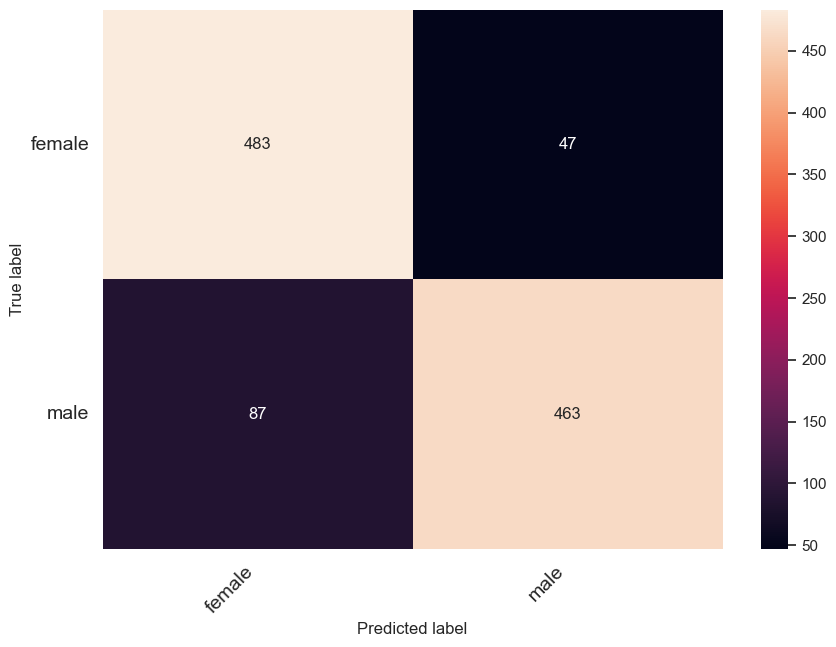

In [45]:
modidfied = final_df
modidfied['Actual_Values'] = final_df.Actual_Values.replace({'female_angry':'female'
                                       , 'female_disgust':'female'
                                       , 'female_fear':'female'
                                       , 'female_happy':'female'
                                       , 'female_sad':'female'
                                       , 'female_surprise':'female'
                                       , 'female_neutral':'female'
                                       , 'male_angry':'male'
                                       , 'male_fear':'male'
                                       , 'male_happy':'male'
                                       , 'male_sad':'male'
                                       , 'male_surprise':'male'
                                       , 'male_neutral':'male'
                                       , 'male_disgust':'male'
                                      })

modidfied['Predicted_Values'] = final_df.Predicted_Values.replace({'female_angry':'female'
                                       , 'female_disgust':'female'
                                       , 'female_fear':'female'
                                       , 'female_happy':'female'
                                       , 'female_sad':'female'
                                       , 'female_surprise':'female'
                                       , 'female_neutral':'female'
                                       , 'male_angry':'male'
                                       , 'male_fear':'male'
                                       , 'male_happy':'male'
                                       , 'male_sad':'male'
                                       , 'male_surprise':'male'
                                       , 'male_neutral':'male'
                                       , 'male_disgust':'male'
                                      })

classes = modidfied.Actual_Values.unique()  
classes.sort() 
 
c_m = confusion_matrix(modidfied.Actual_Values, modidfied.Predicted_Values)
print(accuracy_score(modidfied.Actual_Values, modidfied.Predicted_Values))
print_confusion_matrix(c_m, class_names = classes)

In [46]:
classes = modidfied.Actual_Values.unique()
classes.sort()    
print(classification_report(modidfied.Actual_Values, modidfied.Predicted_Values, target_names=classes))

              precision    recall  f1-score   support

      female       0.85      0.91      0.88       530
        male       0.91      0.84      0.87       550

    accuracy                           0.88      1080
   macro avg       0.88      0.88      0.88      1080
weighted avg       0.88      0.88      0.88      1080



0.3277777777777778


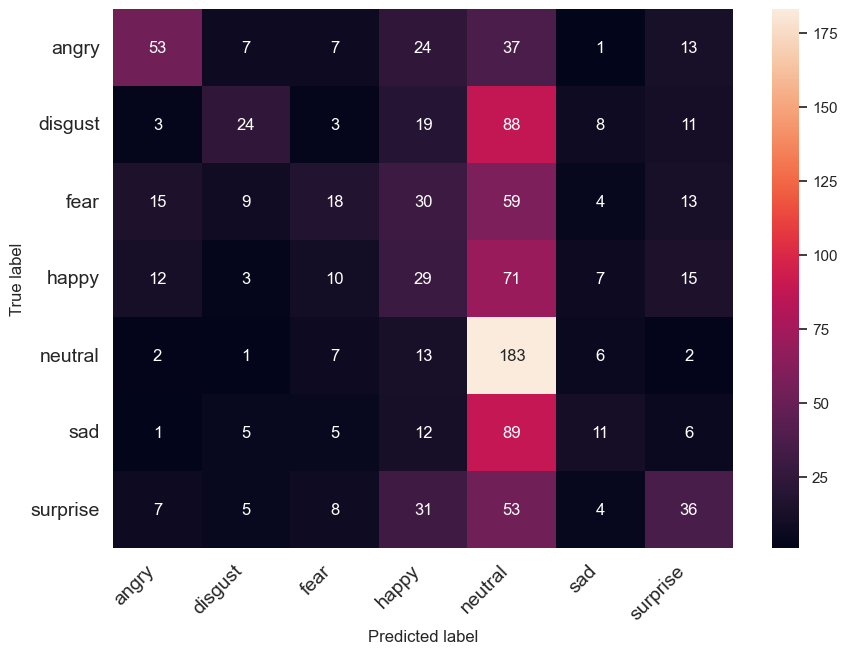

In [47]:
modidfied = pd.read_csv("Predictions.csv")
modidfied['Actual_Values'] = modidfied.Actual_Values.replace({'female_angry':'angry'
                                       , 'female_disgust':'disgust'
                                       , 'female_fear':'fear'
                                       , 'female_happy':'happy'
                                       , 'female_sad':'sad'
                                       , 'female_surprise':'surprise'
                                       , 'female_neutral':'neutral'
                                       , 'male_angry':'angry'
                                       , 'male_fear':'fear'
                                       , 'male_happy':'happy'
                                       , 'male_sad':'sad'
                                       , 'male_surprise':'surprise'
                                       , 'male_neutral':'neutral'
                                       , 'male_disgust':'disgust'
                                      })

modidfied['Predicted_Values'] = modidfied.Predicted_Values.replace({'female_angry':'angry'
                                       , 'female_disgust':'disgust'
                                       , 'female_fear':'fear'
                                       , 'female_happy':'happy'
                                       , 'female_sad':'sad'
                                       , 'female_surprise':'surprise'
                                       , 'female_neutral':'neutral'
                                       , 'male_angry':'angry'
                                       , 'male_fear':'fear'
                                       , 'male_happy':'happy'
                                       , 'male_sad':'sad'
                                       , 'male_surprise':'surprise'
                                       , 'male_neutral':'neutral'
                                       , 'male_disgust':'disgust'
                                      })

classes = modidfied.Actual_Values.unique() 
classes.sort() 

c_m = confusion_matrix(modidfied.Actual_Values, modidfied.Predicted_Values)
print(accuracy_score(modidfied.Actual_Values, modidfied.Predicted_Values))
print_confusion_matrix(c_m, class_names = classes)

In [48]:
classes = modidfied.Actual_Values.unique()
classes.sort()    
print(classification_report(modidfied.Actual_Values, modidfied.Predicted_Values, target_names=classes))

              precision    recall  f1-score   support

       angry       0.57      0.37      0.45       142
     disgust       0.44      0.15      0.23       156
        fear       0.31      0.12      0.17       148
       happy       0.18      0.20      0.19       147
     neutral       0.32      0.86      0.46       214
         sad       0.27      0.09      0.13       129
    surprise       0.38      0.25      0.30       144

    accuracy                           0.33      1080
   macro avg       0.35      0.29      0.28      1080
weighted avg       0.35      0.33      0.29      1080



In [49]:
def noise(data, noise_factor=0.0001):

    noise_amp = noise_factor * np.random.uniform() * np.random.normal(size=data.shape[0])
    data = data.astype('float64') + noise_amp * np.random.normal(size=data.shape[0])
    return data

def speedNpitch(data):

    length_change = np.random.uniform(low=0.8, high=1)
    speed_fac = 1.2 / length_change 
    tmp = np.interp(np.arange(0, len(data), speed_fac), np.arange(0, len(data)), data)
    minlen = min(data.shape[0], tmp.shape[0])
    data *= 0
    data[0:minlen] = tmp[0:minlen]
    return data


In [56]:
def custom_data_prep(df, n, aug, mfcc):
    X = np.empty(shape=(df.shape[0], n, 216, 1))
    input_length = sampling_rate * audio_duration
    
    cnt = 0
    for fname in tqdm(df.path):
        file_path = fname
        data, _ = librosa.load(file_path, sr=sampling_rate
                               ,res_type="kaiser_fast"
                               ,duration=2.5
                               ,offset=0.5
                              )

        if len(data) > input_length:
            max_offset = len(data) - input_length
            offset = np.random.randint(max_offset)
            data = data[offset:(input_length+offset)]
        else:
            if input_length > len(data):
                max_offset = input_length - len(data)
                offset = np.random.randint(max_offset)
            else:
                offset = 0
            data = np.pad(data, (offset, int(input_length) - len(data) - offset), "constant")
 
        if aug == 1:
            data = speedNpitch(data)
        
        if mfcc == 1:
            MFCC = librosa.feature.mfcc(y=data, sr=sr, n_mfcc=n_mfcc)
            MFCC = np.expand_dims(MFCC, axis=-1)
            X[cnt,] = MFCC
            
        else:
            melspec = librosa.feature.melspectrogram(y=data, n_mels = n_melspec)   
            logspec = librosa.amplitude_to_db(melspec)
            logspec = np.expand_dims(logspec, axis=-1)
            X[cnt,] = logspec
            
        cnt += 1
    return X
     
def print_confusion_matrix(confusion_matrix, class_names, figsize = (10,7), fontsize=14):
    
    df_cm = pd.DataFrame(
        confusion_matrix, index=class_names, columns=class_names, 
    )
    fig = plt.figure(figsize=figsize)
    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt="d")
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")

    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

def get_2d_convolution_model(n):
    
    nclass = 14
    inp = Input(shape=(n,216,1))
    x = Convolution2D(32, (4,10), padding="same")(inp)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = MaxPool2D()(x)
    x = Dropout(rate=0.2)(x)
    
    x = Convolution2D(32, (4,10), padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = MaxPool2D()(x)
    x = Dropout(rate=0.2)(x)
    
    x = Convolution2D(32, (4,10), padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = MaxPool2D()(x)
    x = Dropout(rate=0.2)(x)
    
    x = Convolution2D(32, (4,10), padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = MaxPool2D()(x)
    x = Dropout(rate=0.2)(x)
    
    x = Flatten()(x)
    x = Dense(64)(x)
    x = Dropout(rate=0.2)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Dropout(rate=0.2)(x)
    
    out = Dense(nclass, activation=softmax)(x)
    model = models.Model(inputs=inp, outputs=out)
    
    opt = tf.keras.optimizers.legacy.Adam(0.001)
    model.compile(optimizer=opt, loss=losses.categorical_crossentropy, metrics=['acc'])
    return model

class get_results:
    
    def __init__(self, model_history, model ,X_test, y_test, labels):
        self.model_history = model_history
        self.model = model
        self.X_test = X_test
        self.y_test = y_test             
        self.labels = labels

    def create_plot(self, model_history):
        plt.plot(model_history.history['acc'])
        plt.plot(model_history.history['val_acc'])
        plt.title('model accuracy')
        plt.ylabel('accuracy')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')
        plt.show()
        plt.plot(model_history.history['loss'])
        plt.plot(model_history.history['val_loss'])
        plt.title('model loss')
        plt.ylabel('loss')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')
        plt.show()

    def create_results(self, model):
        opt = tf.keras.optimizers.legacy.Adam(0.001)
        model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
        score = model.evaluate(X_test, y_test, verbose=0)
        print("%s: %.2f%%" % (model.metrics_names[1], score[1]*100))

    def confusion_results(self, X_test, y_test, labels, model):
        preds = model.predict(X_test, 
                                 batch_size=16, 
                                 verbose=2)
        preds=preds.argmax(axis=1)
        preds = preds.astype(int).flatten()
        preds = (lb.inverse_transform((preds)))

        actual = y_test.argmax(axis=1)
        actual = actual.astype(int).flatten()
        actual = (lb.inverse_transform((actual)))

        classes = labels
        classes.sort()    

        c = confusion_matrix(actual, preds)
        print_confusion_matrix(c, class_names = classes)
    
    def accuracy_results_gender(self, X_test, y_test, labels, model):
    
        preds = model.predict(X_test, 
                         batch_size=16, 
                         verbose=2)
        preds=preds.argmax(axis=1)
        preds = preds.astype(int).flatten()
        preds = (lb.inverse_transform((preds)))

        actual = y_test.argmax(axis=1)
        actual = actual.astype(int).flatten()
        actual = (lb.inverse_transform((actual)))
        
        
        actual = pd.DataFrame(actual).replace({'female_angry':'female'
                   , 'female_disgust':'female'
                   , 'female_fear':'female'
                   , 'female_happy':'female'
                   , 'female_sad':'female'
                   , 'female_surprise':'female'
                   , 'female_neutral':'female'
                   , 'male_angry':'male'
                   , 'male_fear':'male'
                   , 'male_happy':'male'
                   , 'male_sad':'male'
                   , 'male_surprise':'male'
                   , 'male_neutral':'male'
                   , 'male_disgust':'male'
                  })
        preds = pd.DataFrame(preds).replace({'female_angry':'female'
               , 'female_disgust':'female'
               , 'female_fear':'female'
               , 'female_happy':'female'
               , 'female_sad':'female'
               , 'female_surprise':'female'
               , 'female_neutral':'female'
               , 'male_angry':'male'
               , 'male_fear':'male'
               , 'male_happy':'male'
               , 'male_sad':'male'
               , 'male_surprise':'male'
               , 'male_neutral':'male'
               , 'male_disgust':'male'
              })

        classes = actual.loc[:,0].unique() 
        classes.sort()    

        c = confusion_matrix(actual, preds)
        print(accuracy_score(actual, preds))
        print_confusion_matrix(c, class_names = classes)
        
   

In [51]:
reference = pd.read_csv("Data_path1.csv")
reference.head()

,labels,source,path
0,male_surprise,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...
1,male_surprise,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...
2,male_angry,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...
3,male_fear,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...
4,male_fear,RAVDESS,RAVDESS Emotional speech audio/audio_speech_ac...


In [53]:
sr=44100
audio_duration=2.5
n_mfcc = 60
mfcc = custom_data_prep(reference, n = n_mfcc, aug = 0, mfcc = 1)

100%|███████████████████████████████████████| 1440/1440 [00:36<00:00, 39.87it/s]


In [54]:
X_train, X_test, y_train, y_test = train_test_split(mfcc
                                                    , reference.labels
                                                    , test_size=0.25
                                                    , shuffle=True
                                                    , random_state=42
                                                   )

lb = LabelEncoder()
y_train = utils.to_categorical(lb.fit_transform(y_train))
y_test = utils.to_categorical(lb.fit_transform(y_test))

mean = np.mean(X_train, axis=0)
std = np.std(X_train, axis=0)

X_train = (X_train - mean)/std
X_test = (X_test - mean)/std

model = get_2d_convolution_model(n=n_mfcc)
model_history = model.fit(X_train, y_train, validation_data=(X_test, y_test), 
                    batch_size=16, verbose = 2, epochs=20)

Epoch 1/20
68/68 - 5s - loss: 2.5576 - acc: 0.1620 - val_loss: 2.1519 - val_acc: 0.3083 - 5s/epoch - 77ms/step
Epoch 2/20
68/68 - 5s - loss: 2.1020 - acc: 0.3259 - val_loss: 2.5658 - val_acc: 0.1278 - 5s/epoch - 71ms/step
Epoch 3/20
68/68 - 5s - loss: 1.8728 - acc: 0.3778 - val_loss: 2.1935 - val_acc: 0.2194 - 5s/epoch - 71ms/step
Epoch 4/20
68/68 - 5s - loss: 1.7723 - acc: 0.4074 - val_loss: 1.8650 - val_acc: 0.3861 - 5s/epoch - 74ms/step
Epoch 5/20
68/68 - 5s - loss: 1.6362 - acc: 0.4639 - val_loss: 1.9233 - val_acc: 0.3417 - 5s/epoch - 72ms/step
Epoch 6/20
68/68 - 5s - loss: 1.5586 - acc: 0.4852 - val_loss: 1.6008 - val_acc: 0.4639 - 5s/epoch - 72ms/step
Epoch 7/20
68/68 - 5s - loss: 1.4789 - acc: 0.5102 - val_loss: 1.3817 - val_acc: 0.5111 - 5s/epoch - 73ms/step
Epoch 8/20
68/68 - 5s - loss: 1.3992 - acc: 0.5167 - val_loss: 1.7137 - val_acc: 0.4333 - 5s/epoch - 74ms/step
Epoch 9/20
68/68 - 5s - loss: 1.3278 - acc: 0.5389 - val_loss: 1.3270 - val_acc: 0.5556 - 5s/epoch - 74ms/step
E

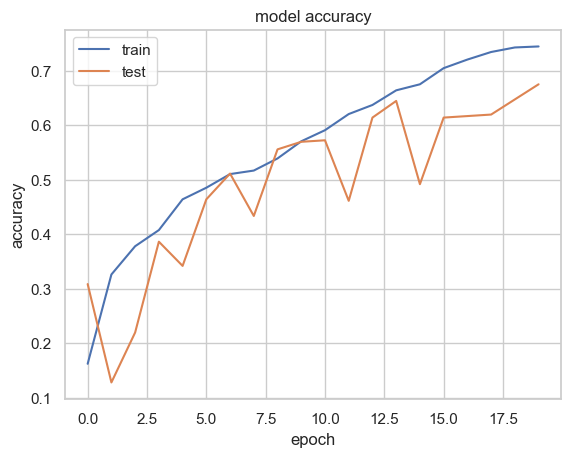

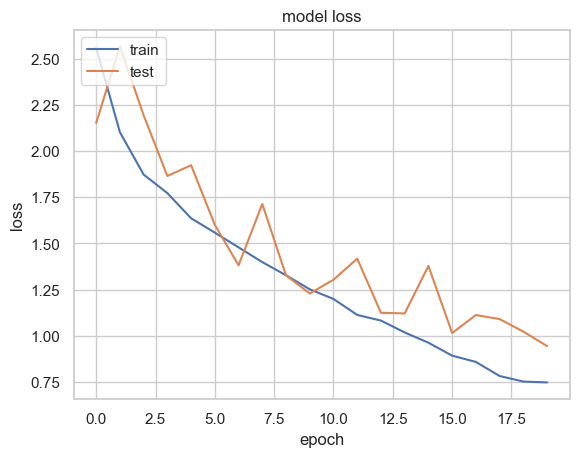

accuracy: 67.50%
23/23 - 1s - 547ms/epoch - 24ms/step


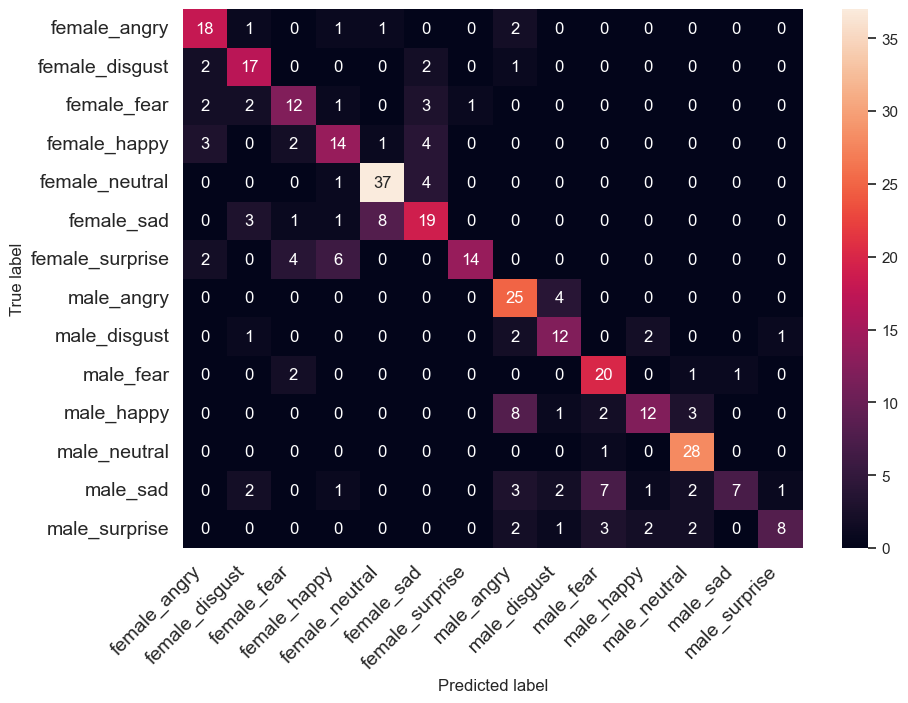

In [55]:
results = get_results(model_history,model,X_test,y_test, reference.labels.unique())
results.create_plot(model_history)
results.create_results(model)
results.confusion_results(X_test, y_test, reference.labels.unique(), model)

In [55]:
model.save(os.path.join('models','mfcc_without_augmentation.h5'))

/Users/half_a_hulk/Desktop/Senti Analysis/SentiAnalysis/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [57]:
sampling_rate=44100
audio_duration=2.5
n_mfcc = 40
mfcc_aug = custom_data_prep(reference, n = n_mfcc, aug = 1, mfcc = 1)

100%|███████████████████████████████████████| 1440/1440 [00:36<00:00, 39.71it/s]


In [59]:
X_train, X_test, y_train, y_test = train_test_split(mfcc_aug
                                                    , reference.labels
                                                    , test_size=0.25
                                                    , shuffle=True
                                                    , random_state=42
                                                   )

lb = LabelEncoder()
y_train = utils.to_categorical(lb.fit_transform(y_train))
y_test = utils.to_categorical(lb.fit_transform(y_test))

"""
mean = np.mean(X_train, axis=0)
std = np.std(X_train, axis=0)

X_train = (X_train - mean)/std
X_test = (X_test - mean)/std
"""
model = get_2d_convolution_model(n=n_mfcc)
model_history = model.fit(X_train, y_train, validation_data=(X_test, y_test), 
                    batch_size=16, verbose = 2, epochs=50)

Epoch 1/50
68/68 - 7s - loss: 2.6826 - acc: 0.1472 - val_loss: 13.4174 - val_acc: 0.1306 - 7s/epoch - 98ms/step
Epoch 2/50
68/68 - 6s - loss: 2.2918 - acc: 0.2435 - val_loss: 3.4773 - val_acc: 0.2389 - 6s/epoch - 93ms/step
Epoch 3/50
68/68 - 6s - loss: 2.0919 - acc: 0.3028 - val_loss: 2.0113 - val_acc: 0.2972 - 6s/epoch - 93ms/step
Epoch 4/50
68/68 - 6s - loss: 1.9239 - acc: 0.3500 - val_loss: 1.7757 - val_acc: 0.3556 - 6s/epoch - 94ms/step
Epoch 5/50
68/68 - 7s - loss: 1.8442 - acc: 0.3769 - val_loss: 1.9611 - val_acc: 0.2556 - 7s/epoch - 96ms/step
Epoch 6/50
68/68 - 7s - loss: 1.7830 - acc: 0.3694 - val_loss: 1.6314 - val_acc: 0.4500 - 7s/epoch - 98ms/step
Epoch 7/50
68/68 - 7s - loss: 1.7041 - acc: 0.4102 - val_loss: 1.8711 - val_acc: 0.3500 - 7s/epoch - 97ms/step
Epoch 8/50
68/68 - 7s - loss: 1.6353 - acc: 0.4278 - val_loss: 1.8472 - val_acc: 0.3167 - 7s/epoch - 100ms/step
Epoch 9/50
68/68 - 7s - loss: 1.5584 - acc: 0.4593 - val_loss: 1.5183 - val_acc: 0.4694 - 7s/epoch - 101ms/ste

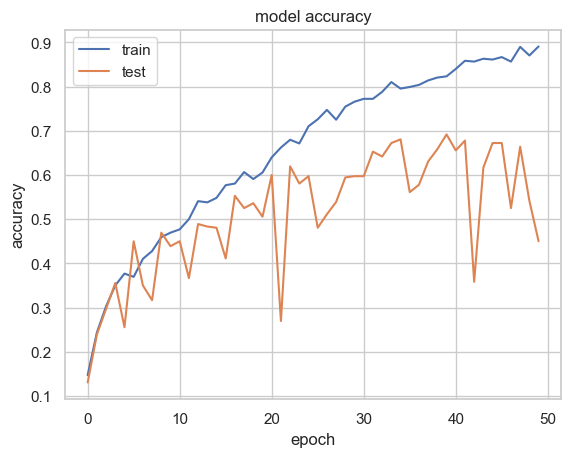

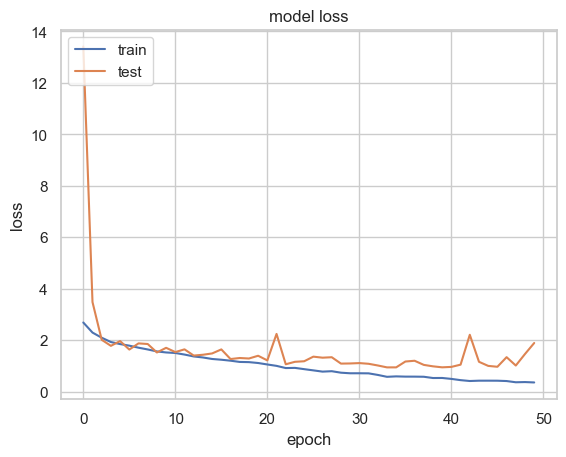

accuracy: 45.00%
23/23 - 1s - 700ms/epoch - 30ms/step


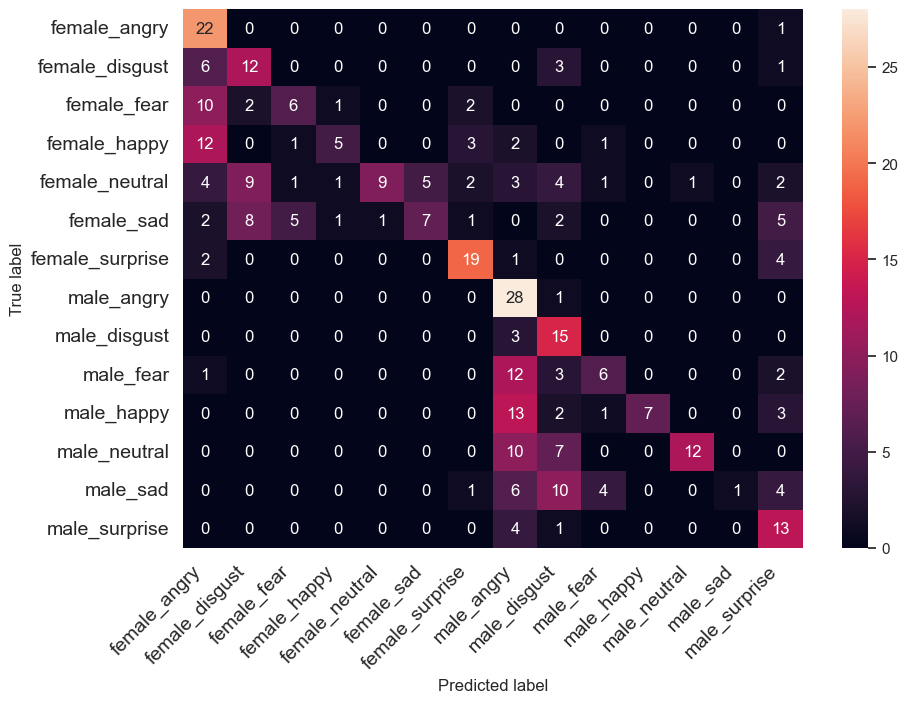

In [60]:
results = get_results(model_history,model,X_test,y_test, reference.labels.unique())
results.create_plot(model_history)
results.create_results(model)
results.confusion_results(X_test, y_test, reference.labels.unique(), model)

In [61]:
model.save(os.path.join('models','mfcc_with_augmentation.h5'))

/Users/half_a_hulk/Desktop/Senti Analysis/SentiAnalysis/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [61]:
sampling_rate=44100
audio_duration=2.5
n_melspec = 60
specgram = custom_data_prep(reference, n = n_melspec, aug = 0, mfcc = 0)

100%|███████████████████████████████████████| 1440/1440 [00:32<00:00, 43.79it/s]


In [62]:
X_train, X_test, y_train, y_test = train_test_split(specgram
                                                    , reference.labels
                                                    , test_size=0.25
                                                    , shuffle=True
                                                    , random_state=42
                                                   )


lb = LabelEncoder()
y_train = utils.to_categorical(lb.fit_transform(y_train))
y_test = utils.to_categorical(lb.fit_transform(y_test))

mean = np.mean(X_train, axis=0)
std = np.std(X_train, axis=0)

X_train = (X_train - mean)/std
X_test = (X_test - mean)/std

model = get_2d_convolution_model(n=n_melspec)
model_history = model.fit(X_train, y_train, validation_data=(X_test, y_test), 
                    batch_size=16, verbose = 2, epochs=20)

Epoch 1/20
68/68 - 11s - loss: 2.6020 - acc: 0.1593 - val_loss: 2.4530 - val_acc: 0.1444 - 11s/epoch - 164ms/step
Epoch 2/20
68/68 - 10s - loss: 2.3685 - acc: 0.2185 - val_loss: 2.5891 - val_acc: 0.0917 - 10s/epoch - 144ms/step
Epoch 3/20
68/68 - 10s - loss: 2.2437 - acc: 0.2602 - val_loss: 2.6465 - val_acc: 0.1167 - 10s/epoch - 146ms/step
Epoch 4/20
68/68 - 10s - loss: 2.0778 - acc: 0.3028 - val_loss: 2.7200 - val_acc: 0.1611 - 10s/epoch - 150ms/step
Epoch 5/20
68/68 - 10s - loss: 1.9561 - acc: 0.3259 - val_loss: 2.3767 - val_acc: 0.2056 - 10s/epoch - 151ms/step
Epoch 6/20
68/68 - 10s - loss: 1.8450 - acc: 0.3574 - val_loss: 2.1355 - val_acc: 0.2278 - 10s/epoch - 154ms/step
Epoch 7/20
68/68 - 11s - loss: 1.7236 - acc: 0.4102 - val_loss: 2.0752 - val_acc: 0.2917 - 11s/epoch - 155ms/step
Epoch 8/20
68/68 - 11s - loss: 1.6713 - acc: 0.4259 - val_loss: 1.9040 - val_acc: 0.3528 - 11s/epoch - 156ms/step
Epoch 9/20
68/68 - 11s - loss: 1.6280 - acc: 0.4370 - val_loss: 1.6076 - val_acc: 0.4667

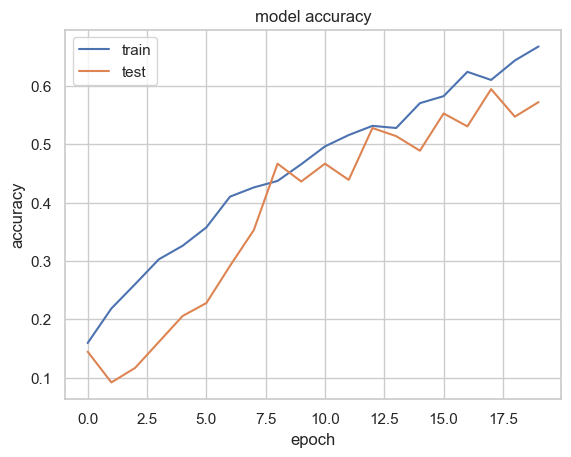

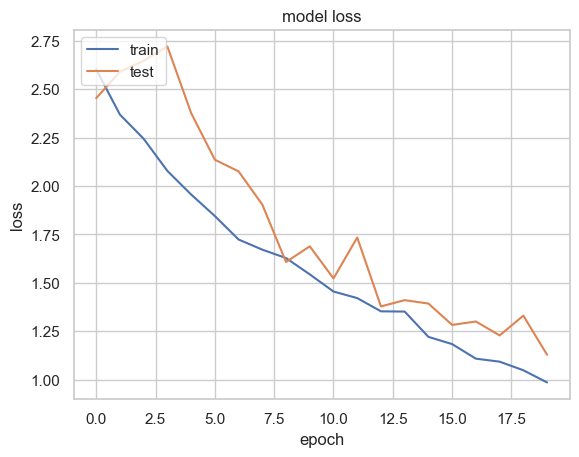

accuracy: 57.22%
23/23 - 1s - 1s/epoch - 45ms/step


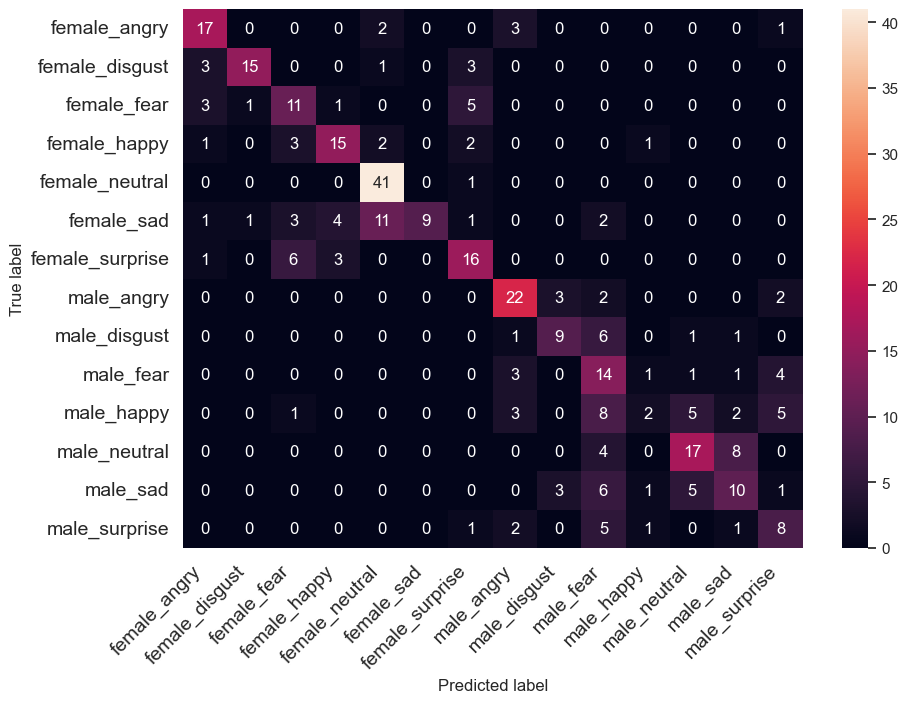

In [63]:
results = get_results(model_history,model,X_test,y_test, reference.labels.unique())
results.create_plot(model_history)
results.create_results(model)
results.confusion_results(X_test, y_test, reference.labels.unique(), model)

In [65]:
model.save(os.path.join('models','log_mel_spec_without_augmentation.h5'))

/Users/half_a_hulk/Desktop/Senti Analysis/SentiAnalysis/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [64]:
sampling_rate=44100
audio_duration=2.5
n_melspec = 60
aug_specgram = custom_data_prep(reference,  n = n_melspec, aug = 1, mfcc = 0)

100%|███████████████████████████████████████| 1440/1440 [00:39<00:00, 36.55it/s]


In [65]:
X_train, X_test, y_train, y_test = train_test_split(aug_specgram
                                                    , reference.labels
                                                    , test_size=0.25
                                                    , shuffle=True
                                                    , random_state=42
                                                   )


lb = LabelEncoder()
y_train = utils.to_categorical(lb.fit_transform(y_train))
y_test = utils.to_categorical(lb.fit_transform(y_test))

mean = np.mean(X_train, axis=0)
std = np.std(X_train, axis=0)

X_train = (X_train - mean)/std
X_test = (X_test - mean)/std

model = get_2d_convolution_model(n=n_melspec)
model_history = model.fit(X_train, y_train, validation_data=(X_test, y_test), 
                    batch_size=16, verbose = 2, epochs=50)

Epoch 1/50
68/68 - 11s - loss: 2.7179 - acc: 0.1241 - val_loss: 2.4282 - val_acc: 0.1861 - 11s/epoch - 160ms/step
Epoch 2/50
68/68 - 9s - loss: 2.5095 - acc: 0.1556 - val_loss: 2.4927 - val_acc: 0.1361 - 9s/epoch - 139ms/step
Epoch 3/50
68/68 - 10s - loss: 2.3580 - acc: 0.2509 - val_loss: 2.6148 - val_acc: 0.1472 - 10s/epoch - 143ms/step
Epoch 4/50
68/68 - 10s - loss: 2.1615 - acc: 0.2861 - val_loss: 2.3146 - val_acc: 0.2167 - 10s/epoch - 144ms/step
Epoch 5/50
68/68 - 10s - loss: 2.0325 - acc: 0.3037 - val_loss: 2.1771 - val_acc: 0.2472 - 10s/epoch - 146ms/step
Epoch 6/50
68/68 - 10s - loss: 2.0218 - acc: 0.3278 - val_loss: 2.0699 - val_acc: 0.2778 - 10s/epoch - 148ms/step
Epoch 7/50
68/68 - 10s - loss: 1.9284 - acc: 0.3435 - val_loss: 2.3011 - val_acc: 0.1861 - 10s/epoch - 150ms/step
Epoch 8/50
68/68 - 10s - loss: 1.8830 - acc: 0.3417 - val_loss: 1.8310 - val_acc: 0.3361 - 10s/epoch - 153ms/step
Epoch 9/50
68/68 - 10s - loss: 1.7882 - acc: 0.3833 - val_loss: 1.9837 - val_acc: 0.2750 -

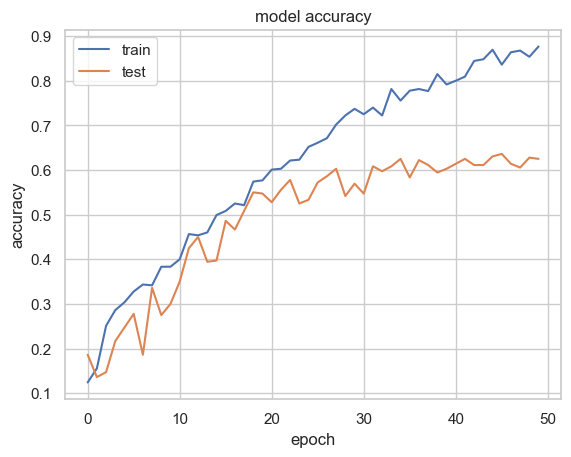

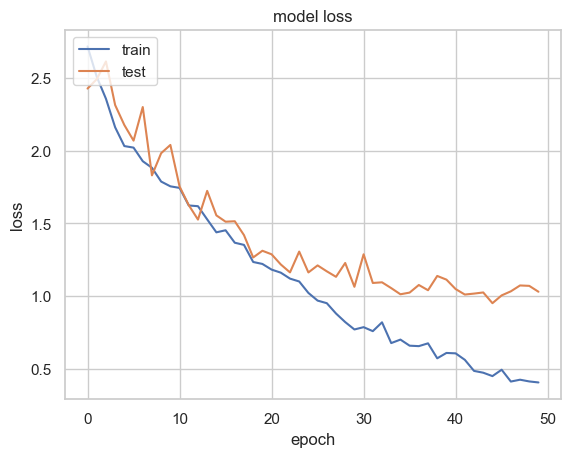

accuracy: 62.50%
23/23 - 1s - 997ms/epoch - 43ms/step


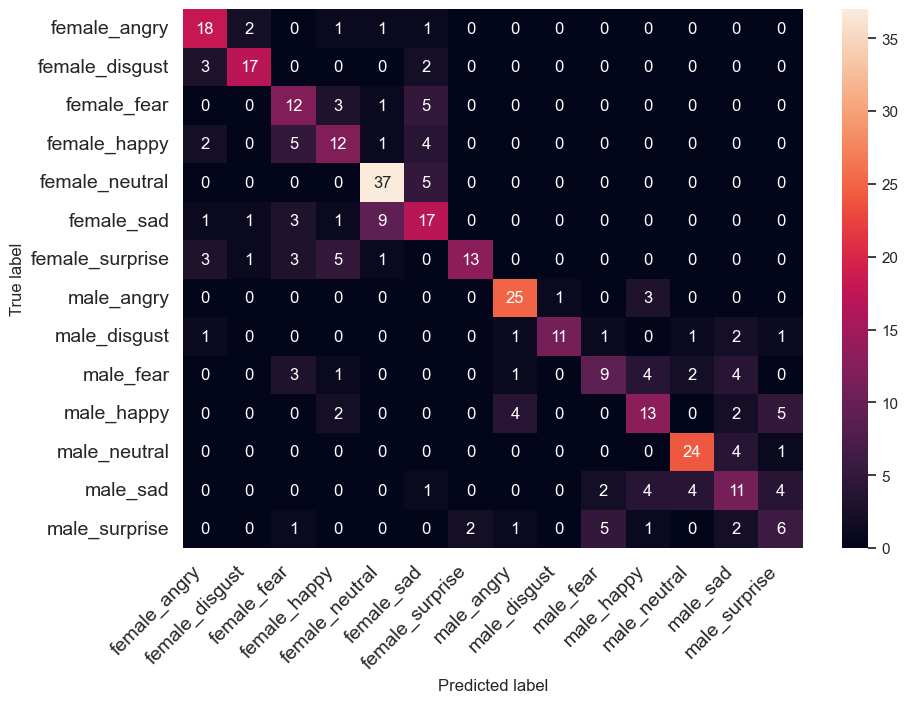

In [66]:
results = get_results(model_history,model,X_test,y_test, reference.labels.unique())
results.create_plot(model_history)
results.create_results(model)
results.confusion_results(X_test, y_test, reference.labels.unique(), model)

In [69]:
model.save(os.path.join('models','log_mel_spec_with_augmentation.h5'))

/Users/half_a_hulk/Desktop/Senti Analysis/SentiAnalysis/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


23/23 - 1s - 734ms/epoch - 32ms/step
0.9694444444444444


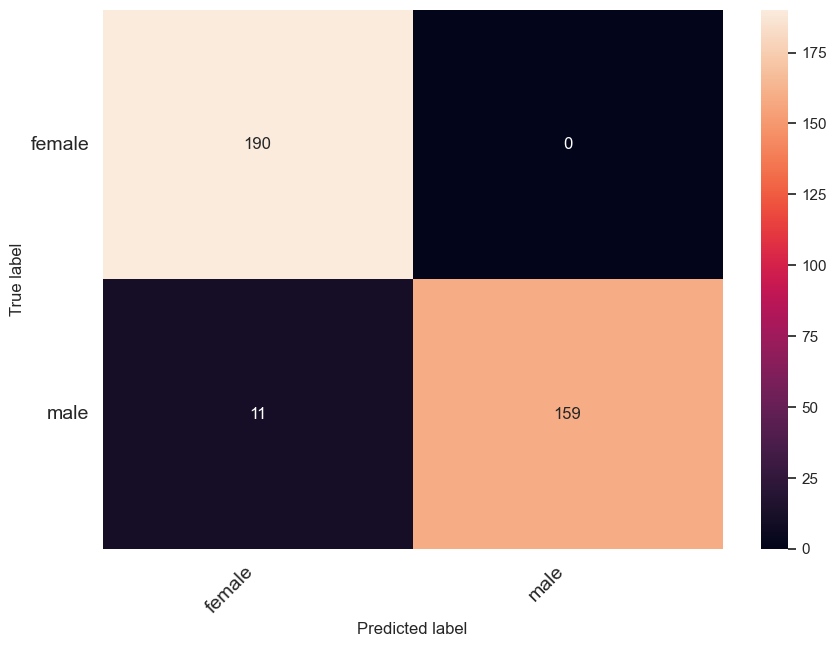

In [67]:
results.accuracy_results_gender(X_test, y_test, reference.labels.unique(), model)